# Import Libraries

In [1]:
import sys
import os
    
# Add path to import
sys.path.append(os.path.abspath(".."))

In [2]:
# Import libraries, variables, and functions
from src.forecasting.utils.libraries_data_handling import np, pd
from src.forecasting.utils.libraries_others import time, gc, Enum
from src.forecasting.utils.libraries_plotting import plt, gridspec, mdates, sns, OneHotEncoder, LinearRegression, sd, pearsonr, spearmanr
from src.forecasting.constants.columns import col_encode, col_decode, waktu_hari_ordinal, hari_ordinal, musim_ordinal
from src.forecasting.constants.color import color_variant
from src.forecasting.utils.memory import cleanup
from src.forecasting.constants.enums import ColumnGroup, PeriodList
from src.forecasting.utils.ordinal_encode import encode_ordinal
from src.forecasting.utils.visualization import descriptive_statistics_plot, extract_statistical_values, univariate_analysis, seasonal_decomp_plot, seasonal_decomp, bivariate_analysis, correlation_heatmap
from src.forecasting.utils.pre_normalization import sqrt_transform, log1p_transform, minmax_transform, sincos_transform, onehot_transform

c:\Users\dendra\Documents\1-Skripsi\Forecast\thesis\env_skripsi\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
The StatsForecast module could not be imported. To enable support for the AutoARIMA, AutoETS and Croston models, please consider installing it.
The `XGBoost` module could not be imported. To enable XGBoost support in Darts, follow the detailed instructions in the installation guide: https://github.com/unit8co/darts/blob/master/INSTALL.md
The `XGBoost` module could not be imported. To enable XGBoost support in Darts, follow the detailed instructions in the installation guide: https://github.com/unit8co/darts/blob/master/INSTALL.md


# Load Dataset

In [3]:
# Load xlsx dataset
df_past = pd.read_excel('../data/raw/past_covariates.xlsx')
df_past.head()

,timestamp,pm2_5 (μg/m³),pm10 (μg/m³),carbon_monoxide (μg/m³),nitrogen_dioxide (μg/m³),sulphur_dioxide (μg/m³),ozone (μg/m³),temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),rain (mm),surface_pressure (hPa),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²)
0,2022-08-05 00:00:00,20.5,31.0,383,30.1,17.0,30,25.6,82,22.3,0.0,1010.5,6.4,286,0
1,2022-08-05 01:00:00,22.4,33.4,333,26.9,17.0,30,25.1,79,21.3,0.0,1010.2,9.0,275,0
2,2022-08-05 02:00:00,24.9,36.9,327,26.6,17.1,27,24.3,81,20.8,0.0,1010.2,7.6,262,0
3,2022-08-05 03:00:00,26.8,39.6,340,27.6,17.5,23,23.9,82,20.6,0.0,1010.3,6.3,239,0
4,2022-08-05 04:00:00,27.3,40.0,384,29.0,19.0,19,23.4,85,20.7,0.0,1010.7,4.1,218,0


In [4]:
# Load future dataset
df_future = pd.read_excel('../data/raw/future_covariates.xlsx')
df_future.head()

,timestamp,pembagian_waktu/hari,hari_per_minggu,hari_libur_nasional,musim
0,2022-08-05 00:00:00,Malam,1900-01-06,False,Musim kemarau
1,2022-08-05 01:00:00,Malam,1900-01-06,False,Musim kemarau
2,2022-08-05 02:00:00,Malam,1900-01-06,False,Musim kemarau
3,2022-08-05 03:00:00,Malam,1900-01-06,False,Musim kemarau
4,2022-08-05 04:00:00,Malam,1900-01-06,False,Musim kemarau


# Data Preprocessing

## Exploratory Data Analysis

In [5]:
# Setting sns plot theme
sns.set_theme(style='white', font_scale=0.9)

# Setting number after coma to max 5 digits
np.set_printoptions(suppress=True, precision=5)

# Make folder for EDA results
os.makedirs('../reports/figures/univariate_analysis', exist_ok=True)
os.makedirs('../reports/figures/univariate_analysis/seasonal_decompose', exist_ok=True)
os.makedirs('../reports/figures/bivariate_analysis', exist_ok=True)

### Data Cleaning

#### Past Dataset

In [6]:
# Check data type
df_past.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25464 entries, 0 to 25463
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   timestamp                 25464 non-null  datetime64[ns]
 1   pm2_5 (μg/m³)             25464 non-null  float64       
 2   pm10 (μg/m³)              25464 non-null  float64       
 3   carbon_monoxide (μg/m³)   25464 non-null  int64         
 4   nitrogen_dioxide (μg/m³)  25464 non-null  float64       
 5   sulphur_dioxide (μg/m³)   25464 non-null  float64       
 6   ozone (μg/m³)             25464 non-null  int64         
 7   temperature_2m (°C)       25464 non-null  float64       
 8   relative_humidity_2m (%)  25464 non-null  int64         
 9   dew_point_2m (°C)         25464 non-null  float64       
 10  rain (mm)                 25464 non-null  float64       
 11  surface_pressure (hPa)    25464 non-null  float64       
 12  wind_speed_10m (km

In [7]:
# Change data type

# Fixing timestamp format
df_past['timestamp']                = df_past['timestamp'].dt.floor('h')

# Change int to float
df_past['carbon_monoxide (μg/m³)']  = df_past['carbon_monoxide (μg/m³)'].astype(float)
df_past['ozone (μg/m³)']            = df_past['ozone (μg/m³)'].astype(float)
df_past['relative_humidity_2m (%)'] = df_past['relative_humidity_2m (%)'].astype(float)
df_past['wind_direction_10m (°)']   = df_past['wind_direction_10m (°)'].astype(float)
df_past['direct_radiation (W/m²)']  = df_past['direct_radiation (W/m²)'].astype(float)

# Check data
df_past.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25464 entries, 0 to 25463
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   timestamp                 25464 non-null  datetime64[ns]
 1   pm2_5 (μg/m³)             25464 non-null  float64       
 2   pm10 (μg/m³)              25464 non-null  float64       
 3   carbon_monoxide (μg/m³)   25464 non-null  float64       
 4   nitrogen_dioxide (μg/m³)  25464 non-null  float64       
 5   sulphur_dioxide (μg/m³)   25464 non-null  float64       
 6   ozone (μg/m³)             25464 non-null  float64       
 7   temperature_2m (°C)       25464 non-null  float64       
 8   relative_humidity_2m (%)  25464 non-null  float64       
 9   dew_point_2m (°C)         25464 non-null  float64       
 10  rain (mm)                 25464 non-null  float64       
 11  surface_pressure (hPa)    25464 non-null  float64       
 12  wind_speed_10m (km

In [8]:
# Change colomns name
df_past_encoded = df_past.rename(columns=col_encode).copy()

# Set index
df_past.set_index('timestamp', inplace=True)
df_past_encoded.set_index('t', inplace=True)

# Set index type to datetime
df_past.index = pd.to_datetime(df_past.index)
df_past_encoded.index = pd.to_datetime(df_past_encoded.index)

# Check data shape
print('Data shape:',df_past_encoded.shape,'\n\n')

df_past_encoded.head()

Data shape: (25464, 14) 




,y1,y2,y3,y4,y5,y6,x1,x2,x3,x4,x5,x6,x7,x8
t,,,,,,,,,,,,,,
2022-08-05 00:00:00,20.5,31.0,383.0,30.1,17.0,30.0,25.6,82.0,22.3,0.0,1010.5,6.4,286.0,0.0
2022-08-05 01:00:00,22.4,33.4,333.0,26.9,17.0,30.0,25.1,79.0,21.3,0.0,1010.2,9.0,275.0,0.0
2022-08-05 02:00:00,24.9,36.9,327.0,26.6,17.1,27.0,24.3,81.0,20.8,0.0,1010.2,7.6,262.0,0.0
2022-08-05 03:00:00,26.8,39.6,340.0,27.6,17.5,23.0,23.9,82.0,20.6,0.0,1010.3,6.3,239.0,0.0
2022-08-05 04:00:00,27.3,40.0,384.0,29.0,19.0,19.0,23.4,85.0,20.7,0.0,1010.7,4.1,218.0,0.0


In [9]:
df_past_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.0,37.088890,23.131323,0.5,20.4,30.6,46.8,195.6
y2,25464.0,49.540485,28.895081,0.8,28.6,41.6,62.9,212.3
y3,25464.0,1010.615771,870.050936,0.0,481.0,738.0,1200.0,9391.0
y4,25464.0,38.158820,30.538787,0.0,16.7,28.3,51.1,284.8
y5,25464.0,28.181633,17.439456,0.2,15.9,23.8,36.1,150.9
y6,25464.0,68.488494,57.695330,-1.0,23.0,53.0,105.0,337.0
x1,25464.0,27.843041,2.852180,21.1,25.6,27.2,29.7,38.1
x2,25464.0,76.477262,16.225320,16.0,68.0,80.0,90.0,100.0
x3,25464.0,22.846281,2.149777,4.0,22.2,23.5,24.2,26.7
x4,25464.0,0.221579,0.912334,0.0,0.0,0.0,0.0,18.4


#### Future Dataset

In [10]:
# Check data type
df_future.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35707 entries, 0 to 35706
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   timestamp             35707 non-null  datetime64[ns]
 1   pembagian_waktu/hari  35707 non-null  object        
 2   hari_per_minggu       35707 non-null  datetime64[ns]
 3   hari_libur_nasional   35707 non-null  bool          
 4   musim                 35707 non-null  object        
dtypes: bool(1), datetime64[ns](2), object(2)
memory usage: 1.1+ MB


In [11]:
# Change data type

# Fixing timestamp format
df_future['timestamp']            = df_future['timestamp'].dt.floor('h')

# Change object to string
df_future['pembagian_waktu/hari'] = df_future['pembagian_waktu/hari'].astype('string')
df_future['hari_per_minggu']      = df_future['timestamp'].dt.day_name().astype('string')
df_future['musim']                = df_future['musim'].astype('string')

# Change categorical to numerical (ordinal ranking)
df_future['pembagian_waktu/hari'] = encode_ordinal(df_future, 'pembagian_waktu/hari', waktu_hari_ordinal)
df_future['hari_per_minggu']      = encode_ordinal(df_future, 'hari_per_minggu', hari_ordinal)
df_future['hari_libur_nasional']  = encode_ordinal(df_future, 'hari_libur_nasional', musim_ordinal)
df_future['musim']                = encode_ordinal(df_future, 'musim', musim_ordinal)

# Check data
df_future.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35707 entries, 0 to 35706
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   timestamp             35707 non-null  datetime64[ns]
 1   pembagian_waktu/hari  35707 non-null  float64       
 2   hari_per_minggu       35707 non-null  float64       
 3   hari_libur_nasional   35707 non-null  float64       
 4   musim                 35707 non-null  float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 1.4 MB


In [12]:
# Change colomns name
df_future_encoded = df_future.rename(columns=col_encode).copy()

# Set index
df_future.set_index('timestamp', inplace=True)
df_future_encoded.set_index('t', inplace=True)

# Set index type to datetime
df_future.index = pd.to_datetime(df_future.index)
df_future_encoded.index = pd.to_datetime(df_future_encoded.index)

# Check data shape
print('Data shape:',df_future_encoded.shape,'\n\n')

df_future_encoded.head()

Data shape: (35707, 4) 




,x9,x10,x11,x12
t,,,,
2022-08-05 00:00:00,3.0,5.0,0.0,1.0
2022-08-05 01:00:00,3.0,5.0,0.0,1.0
2022-08-05 02:00:00,3.0,5.0,0.0,1.0
2022-08-05 03:00:00,3.0,5.0,0.0,1.0
2022-08-05 04:00:00,3.0,5.0,0.0,1.0


### Statistic Descriptive

In [13]:
# Check descriptive statistics dataset
pd.set_option('display.float_format', '{:.3f}'.format)
statdas = df_past.describe()
statdas.T

,count,mean,std,min,25%,50%,75%,max
pm2_5 (μg/m³),25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
pm10 (μg/m³),25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
carbon_monoxide (μg/m³),25464.000,1010.616,870.051,0.000,481.000,738.000,1200.000,9391.000
nitrogen_dioxide (μg/m³),25464.000,38.159,30.539,0.000,16.700,28.300,51.100,284.800
sulphur_dioxide (μg/m³),25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
ozone (μg/m³),25464.000,68.488,57.695,-1.000,23.000,53.000,105.000,337.000
temperature_2m (°C),25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
relative_humidity_2m (%),25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
dew_point_2m (°C),25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
rain (mm),25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


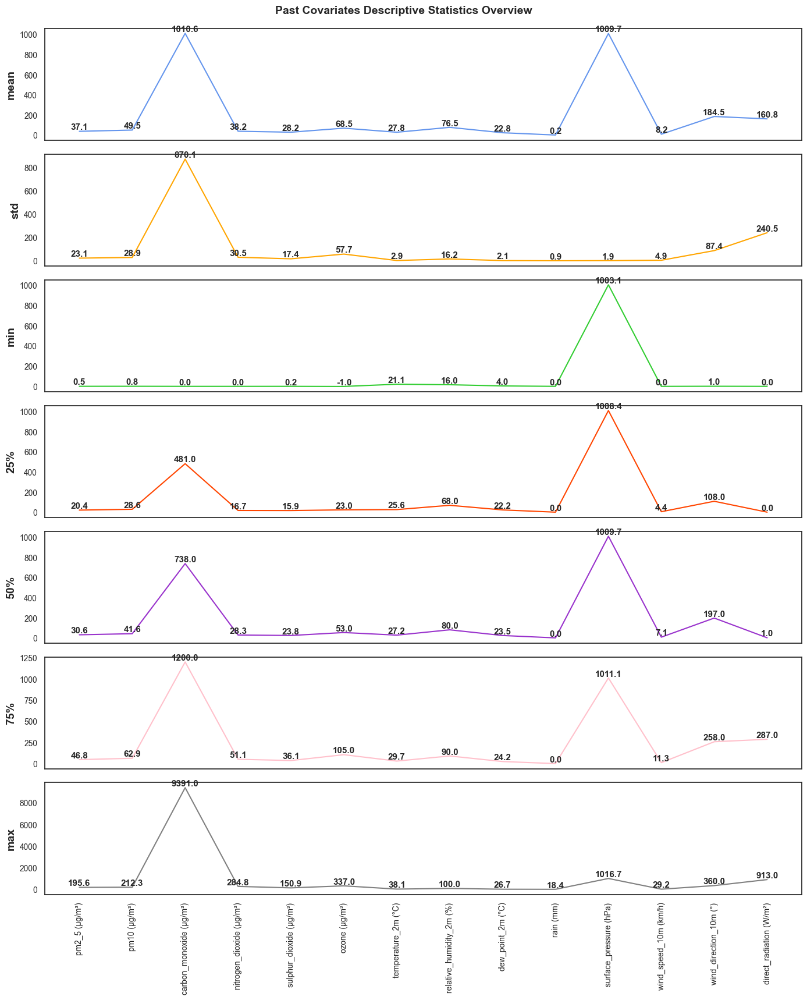

In [14]:
# Statistic descriptive plot
descriptive_statistics_plot(
    df          = statdas[1:].T, 
    color_var   = color_variant,
    show_values = True,
    save_path   = '../reports/figures/univariate_analysis/descriptive_statistics_overview.png'
)

### Univariate Analysis

#### Line Plot

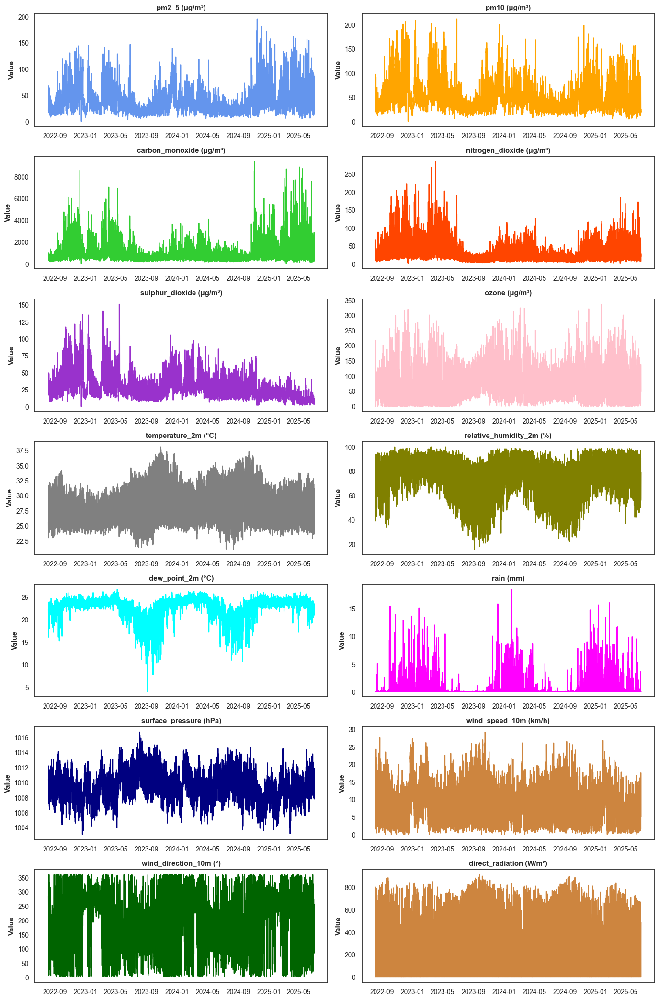

In [15]:
# Data distribution with lineplot
univariate_analysis(
    df            = df_past_encoded, 
    plot_type     = 'lineplot', 
    col_decode    = col_decode, 
    nrows         = int(ColumnGroup.NUMERICAL / 2), 
    ncols         = 2, 
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    color_variant = color_variant,
    group         = ColumnGroup.NUMERICAL,
    save_path     = '../reports/figures/univariate_analysis/lineplot_all_columns.png'
)

#### Scatter Plot

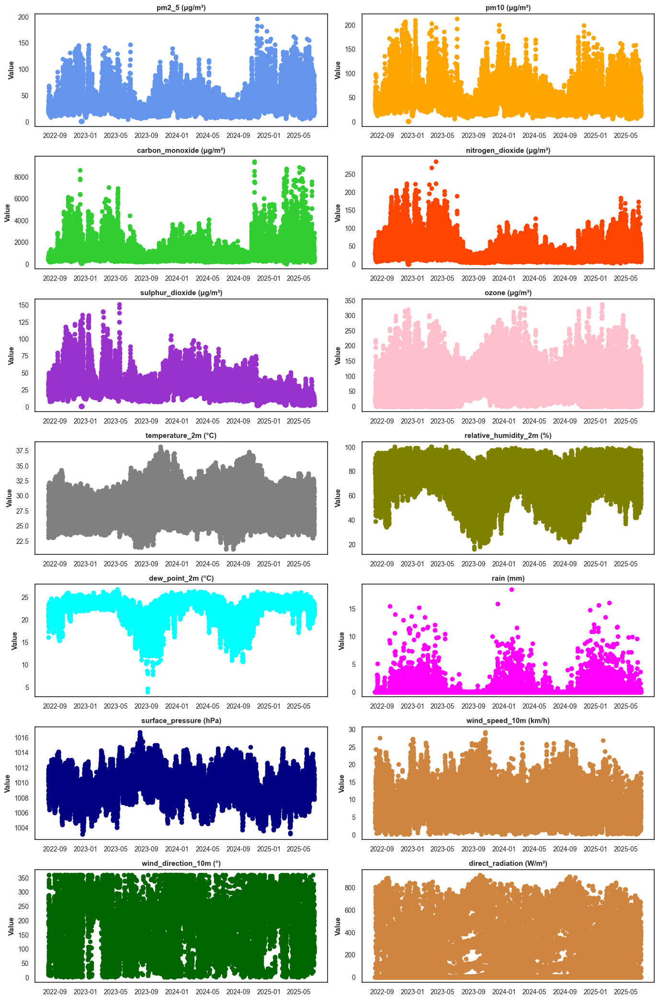

In [16]:
# Data distribution with scatterplot
univariate_analysis(
    df            = df_past_encoded,
    plot_type     = 'scatterplot',
    col_decode    = col_decode,
    nrows         = int(ColumnGroup.NUMERICAL / 2),
    ncols         = 2,
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    color_variant = color_variant,
    group         = ColumnGroup.NUMERICAL,
    save_path     = '../reports/figures/univariate_analysis/scatterplot_all_columns.png'
)

#### Histogram Plot

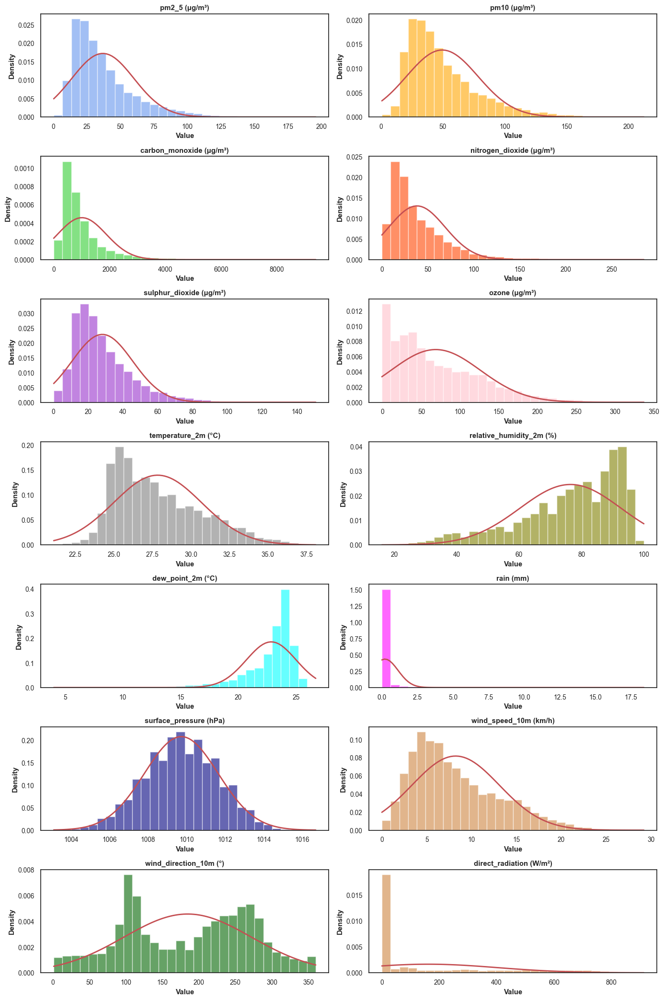

In [17]:
# Data distribution with histplot
univariate_analysis(
    df            = df_past_encoded, 
    plot_type     = 'histplot', 
    col_decode    = col_decode, 
    nrows         = int(ColumnGroup.NUMERICAL / 2), 
    ncols         = 2, 
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    color_variant = color_variant,
    group         = ColumnGroup.NUMERICAL,
    save_path     = '../reports/figures/univariate_analysis/histplot_all_columns.png'
)

#### Box Plot

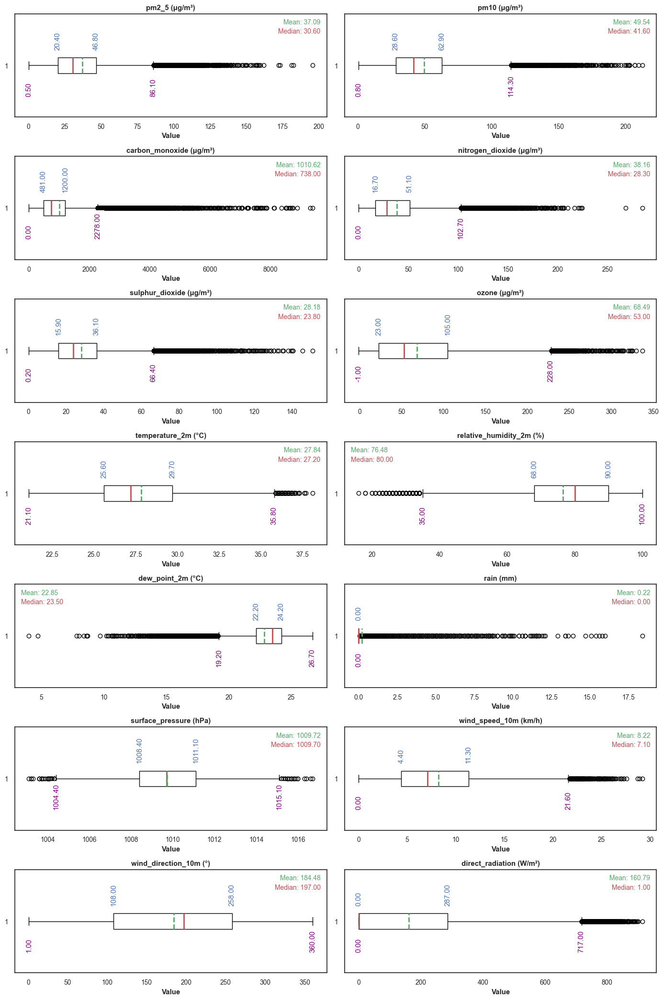

In [18]:
# Numerical data distribution with boxplot
univariate_analysis(
    df            = df_past_encoded, 
    plot_type     = 'boxplot', 
    col_decode    = col_decode, 
    nrows         = int(ColumnGroup.NUMERICAL / 2), 
    ncols         = 2, 
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    group         = ColumnGroup.NUMERICAL,
    save_path     = '../reports/figures/univariate_analysis/boxplot_all_columns.png',
    statdas       = statdas.rename(columns=col_encode),
    showmeans     = True,
    meanline      = True,
    medianprops   = {'color': 'r', 'linewidth': 2},
    meanprops     = {'color': 'g', 'linewidth': 2, 'linestyle': '--'}
)

#### Seasonal Decompose

In [19]:
# Take only target variables
Y = df_past_encoded[df_past_encoded.columns[:ColumnGroup.TARGET]]
Y.head()

,y1,y2,y3,y4,y5,y6
t,,,,,,
2022-08-05 00:00:00,20.500,31.000,383.000,30.100,17.000,30.000
2022-08-05 01:00:00,22.400,33.400,333.000,26.900,17.000,30.000
2022-08-05 02:00:00,24.900,36.900,327.000,26.600,17.100,27.000
2022-08-05 03:00:00,26.800,39.600,340.000,27.600,17.500,23.000
2022-08-05 04:00:00,27.300,40.000,384.000,29.000,19.000,19.000


##### Yearly

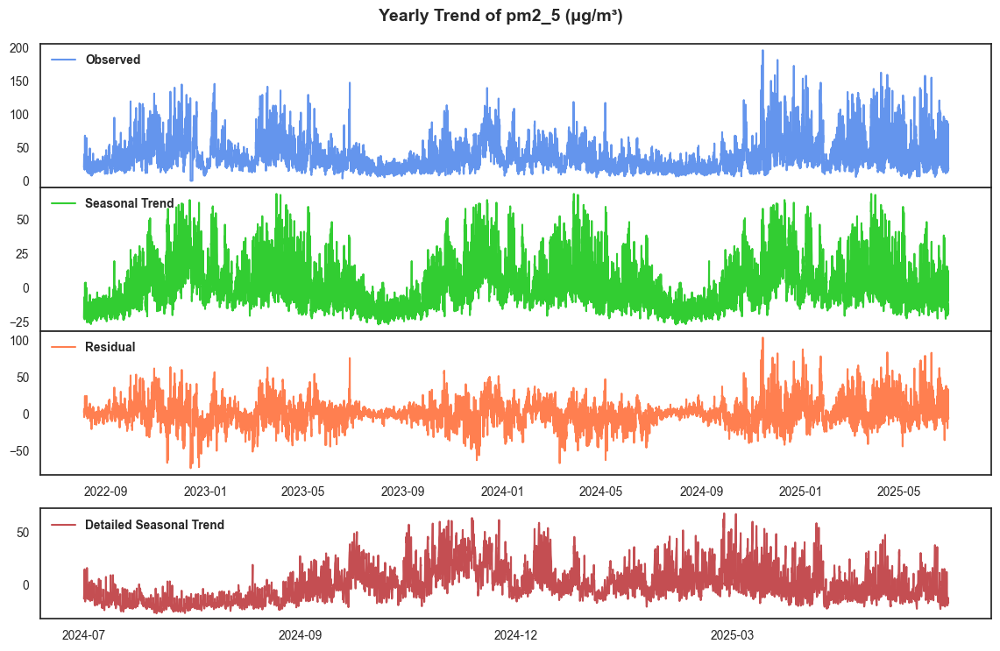

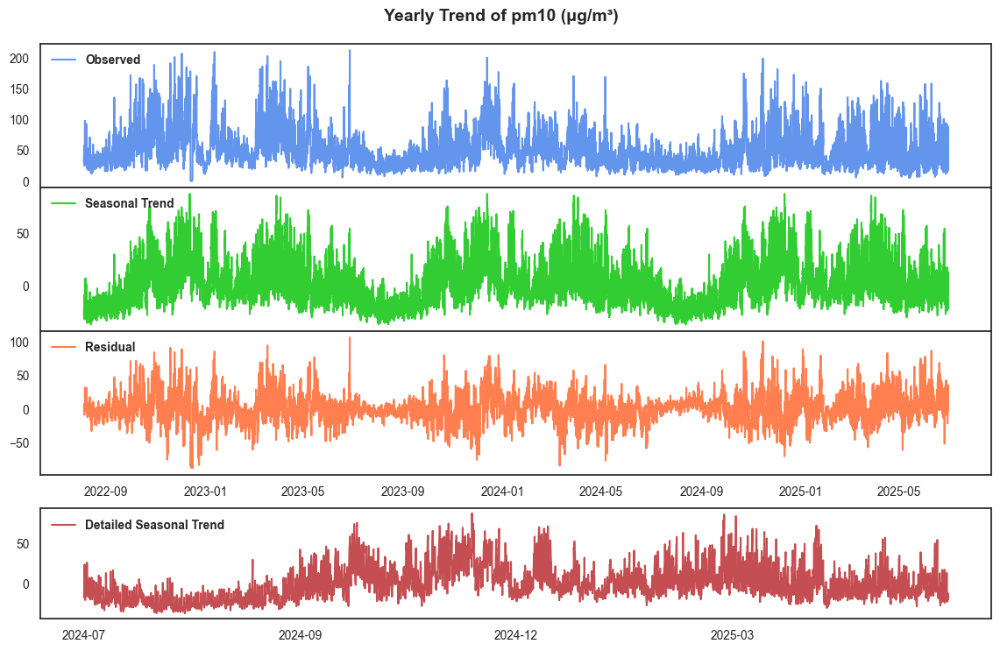

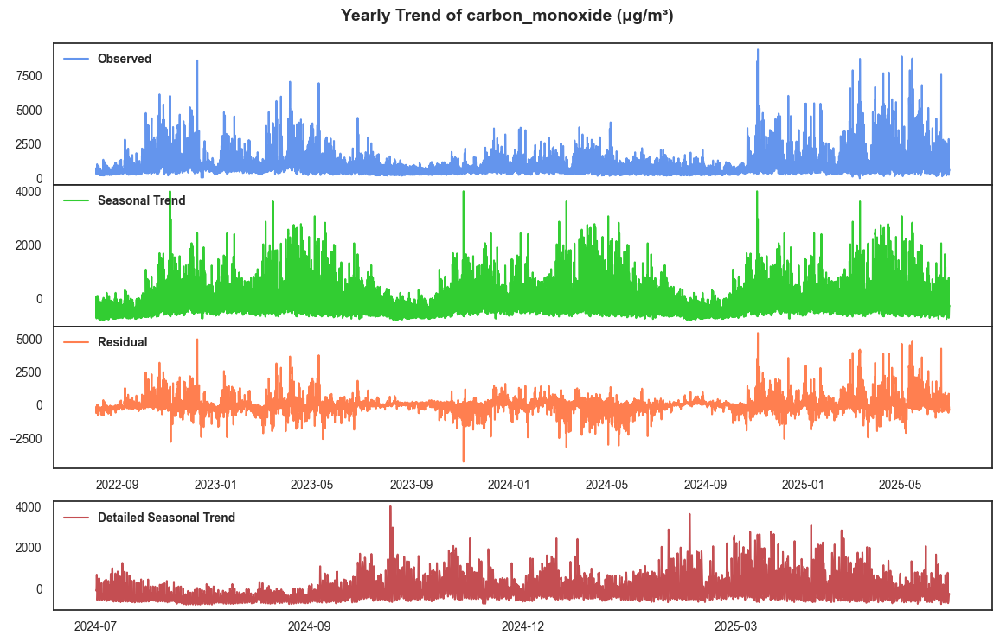

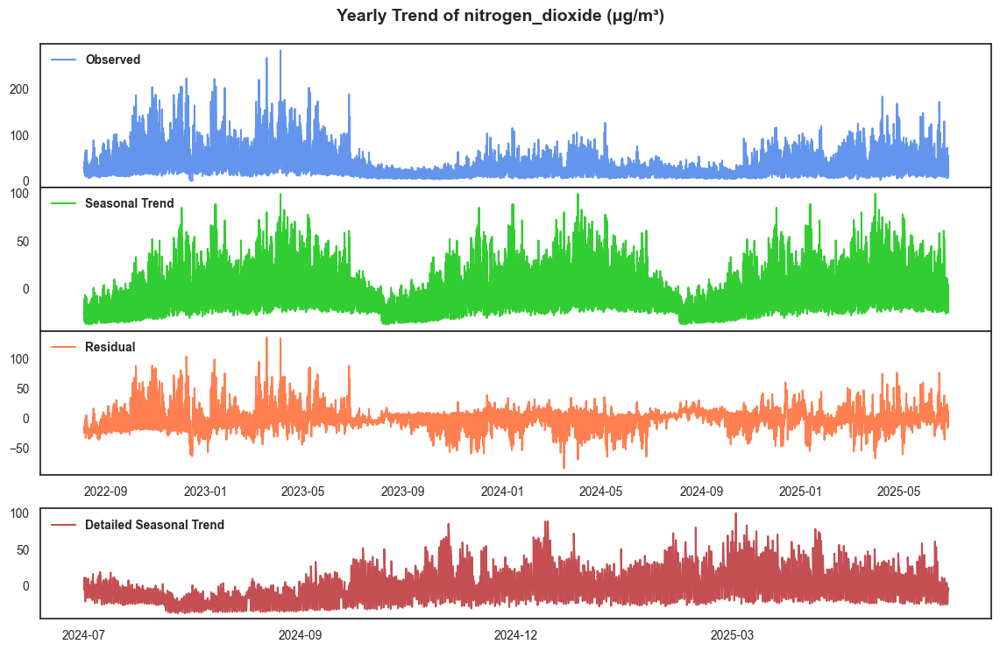

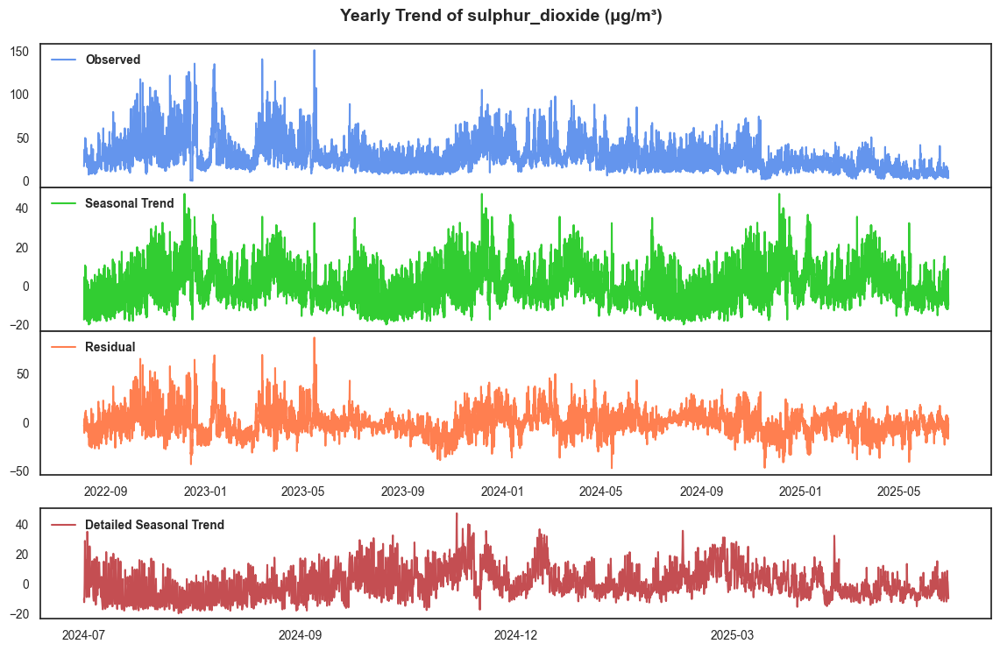

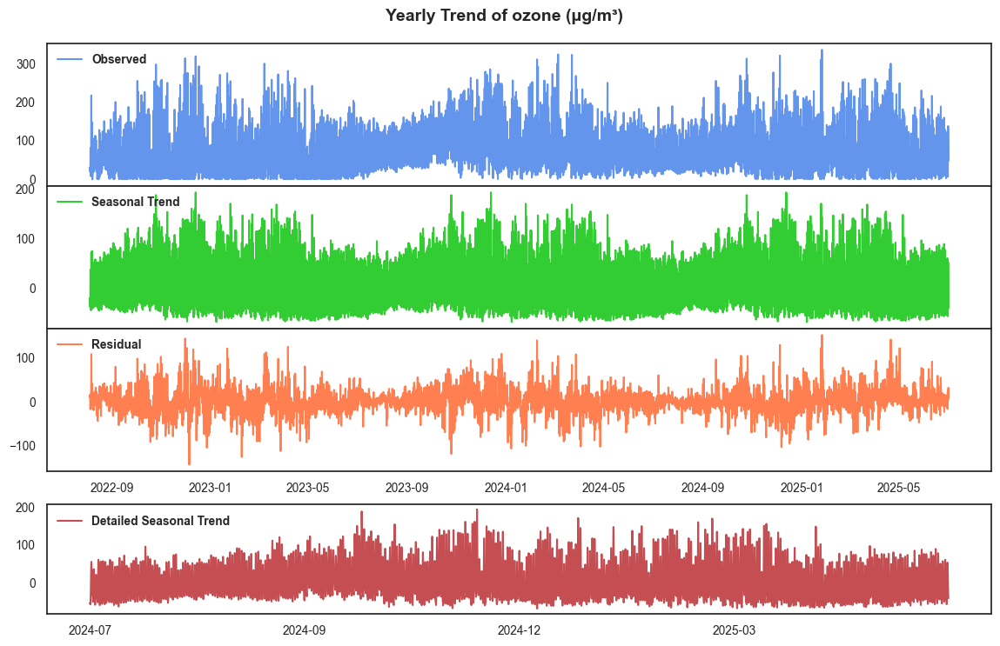

In [20]:
# 1 year seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.Y1,
)

##### 6 months

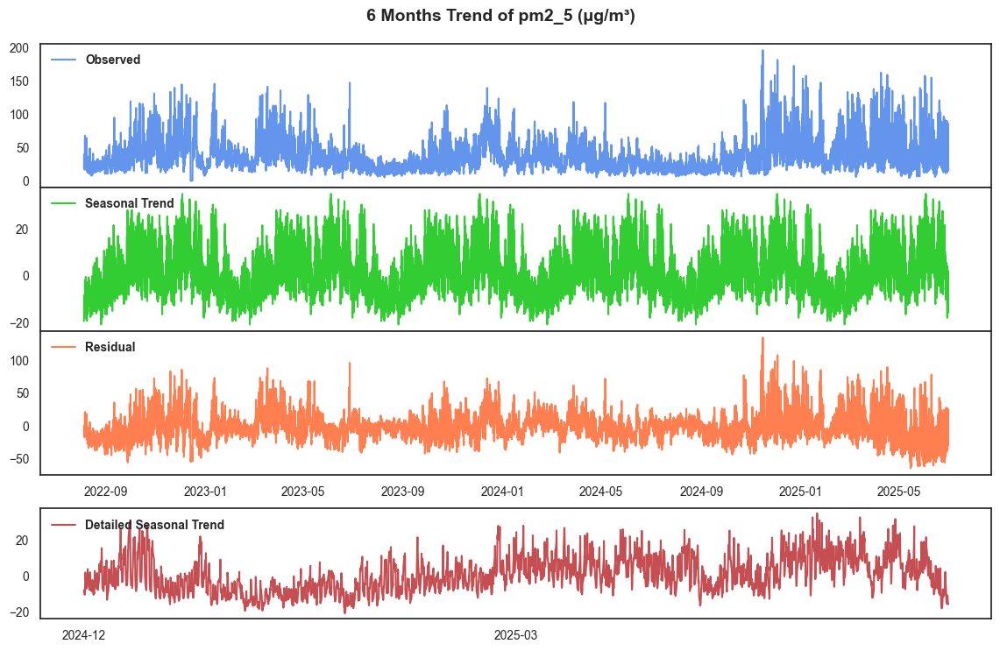

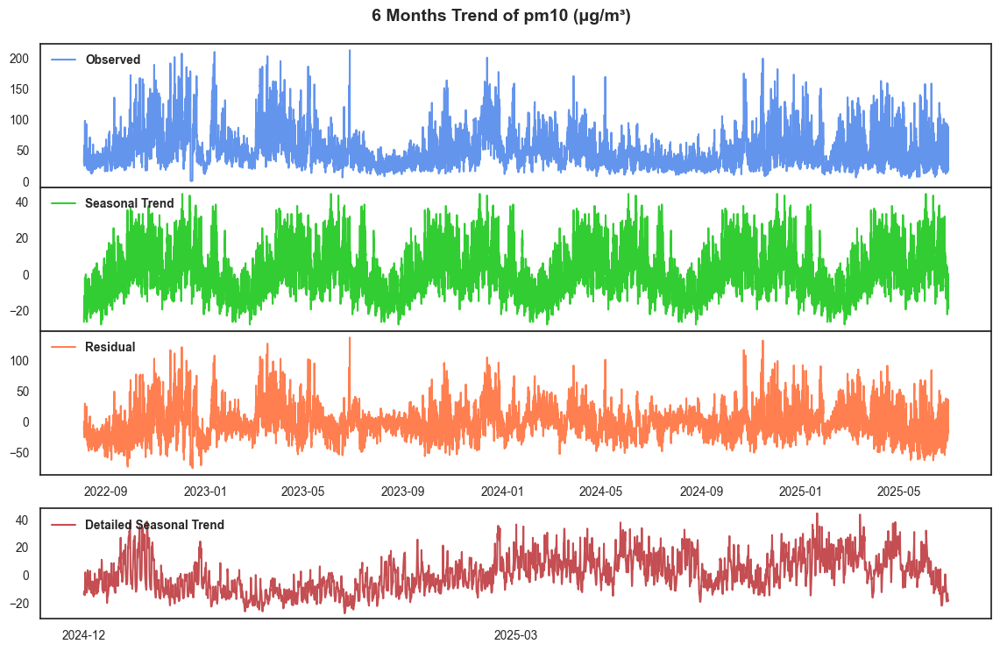

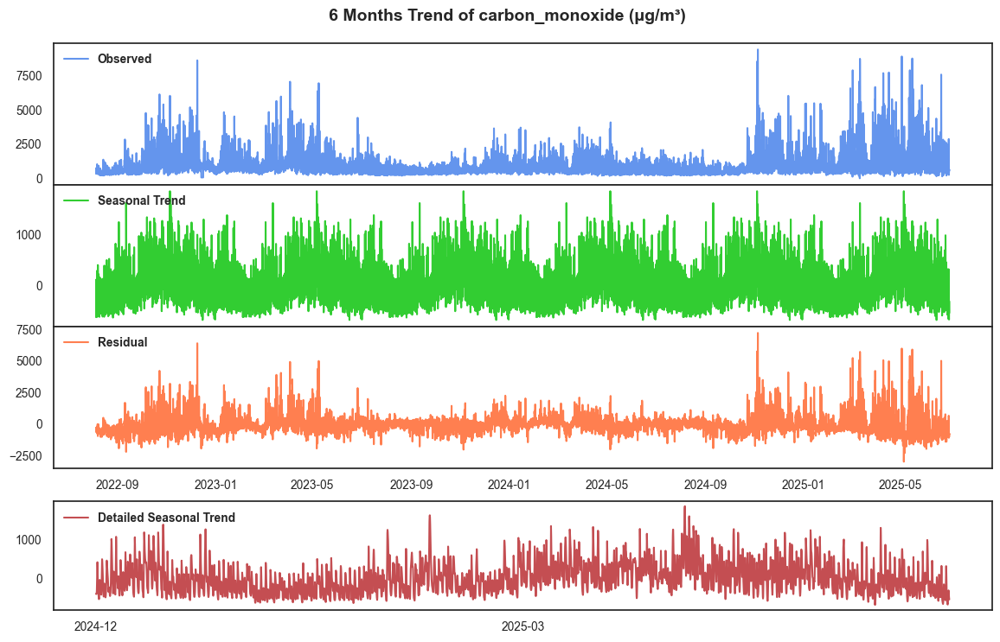

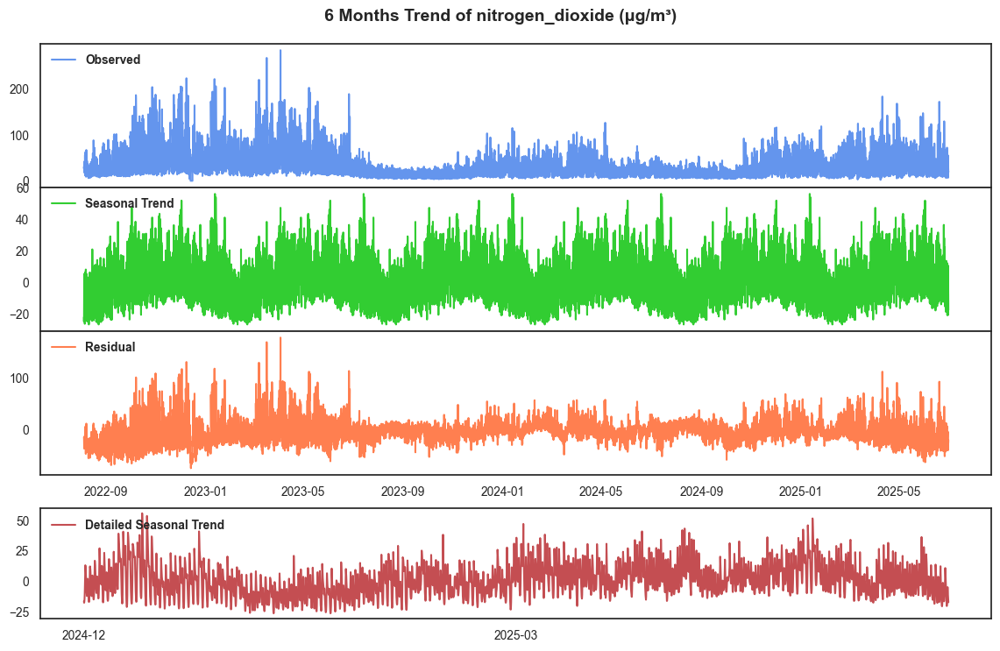

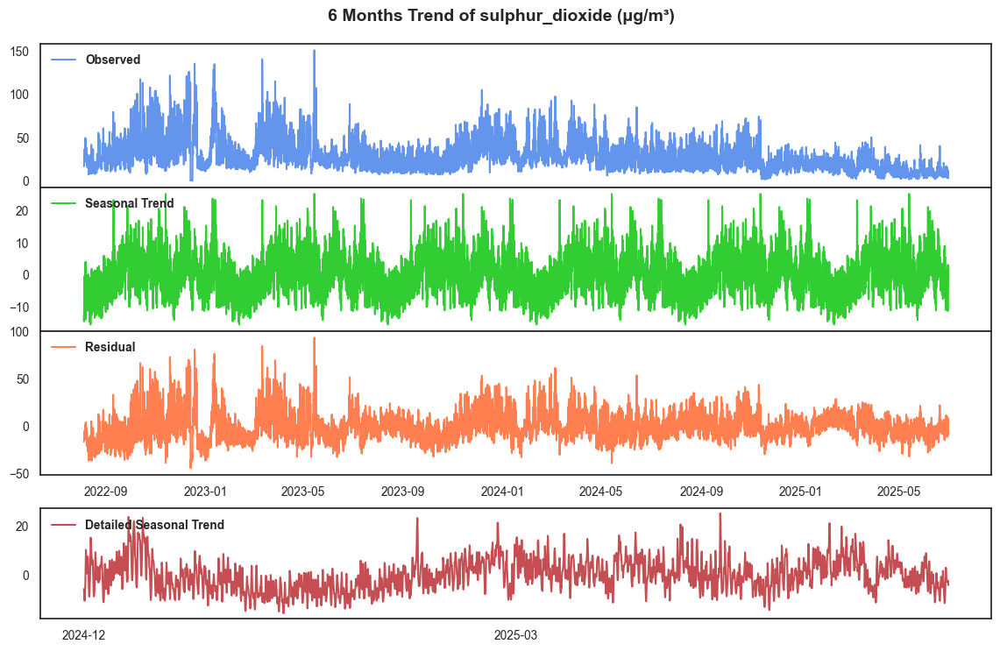

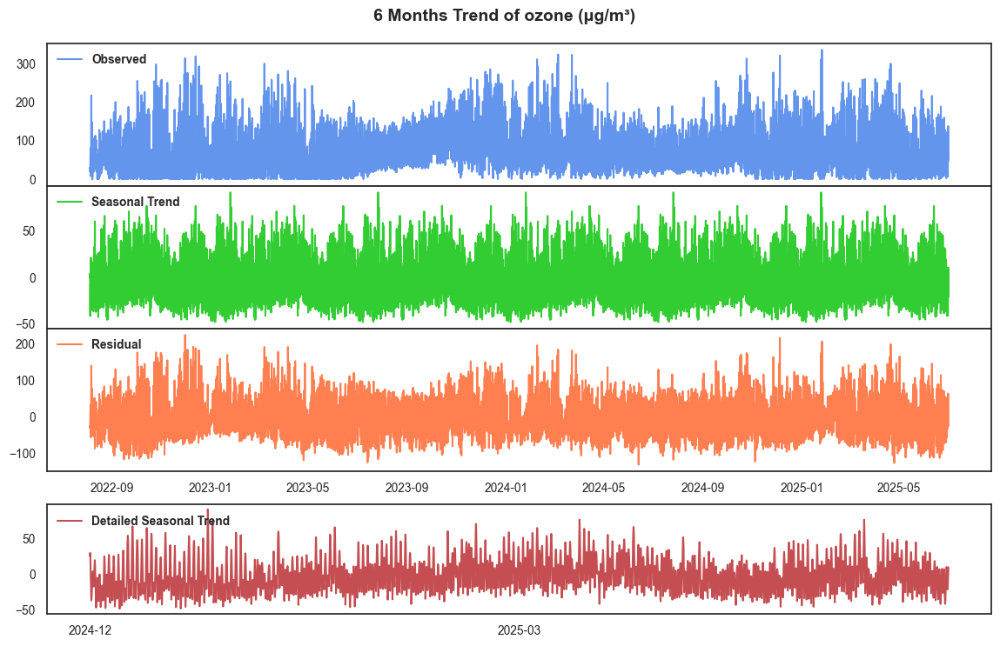

In [21]:
# 6 months seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.M6
)

##### 3 months

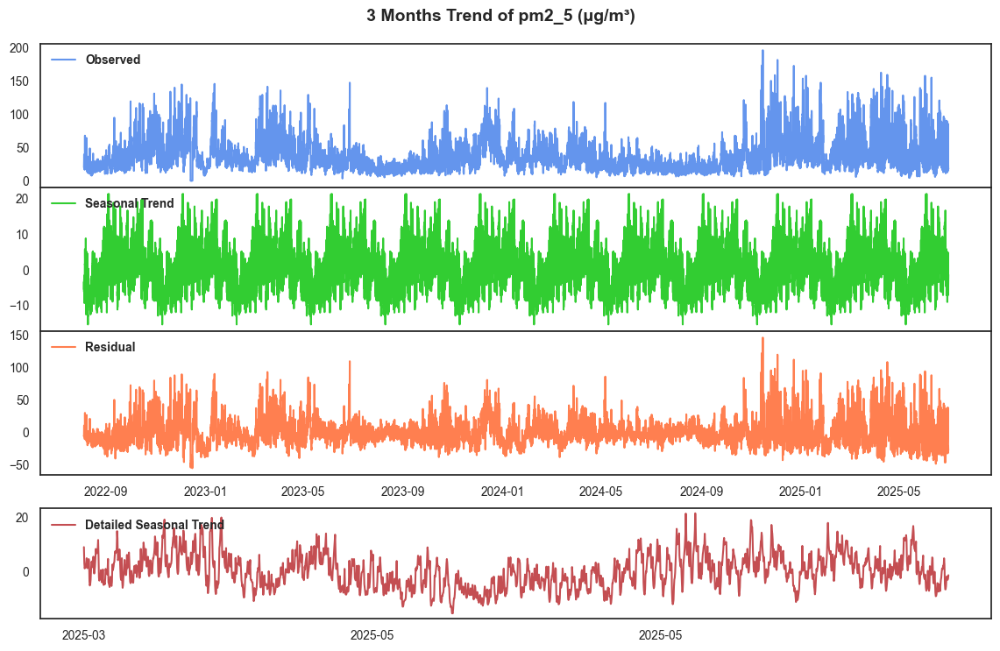

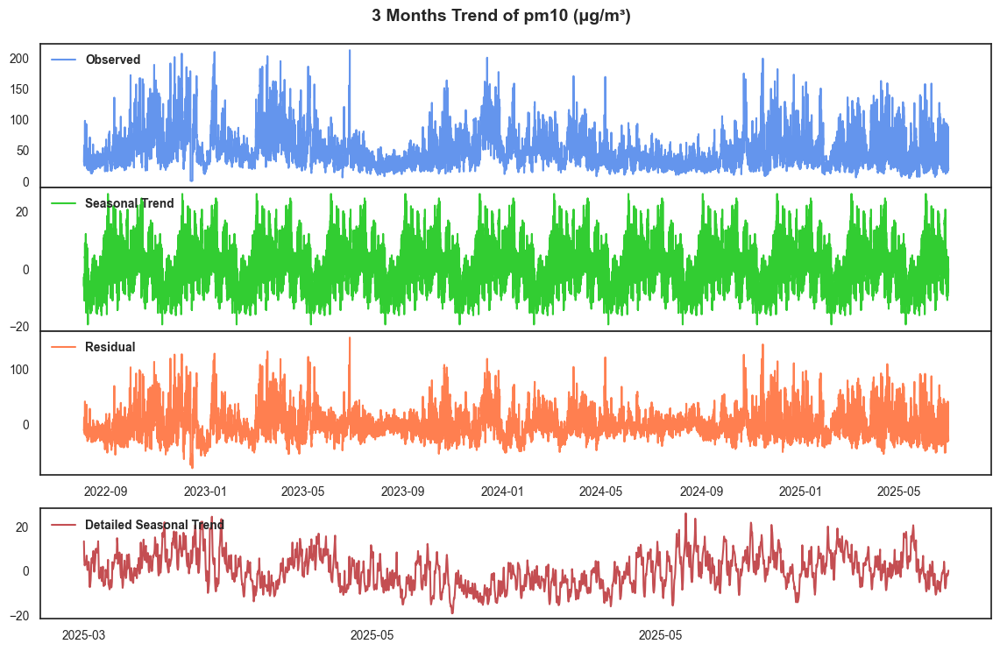

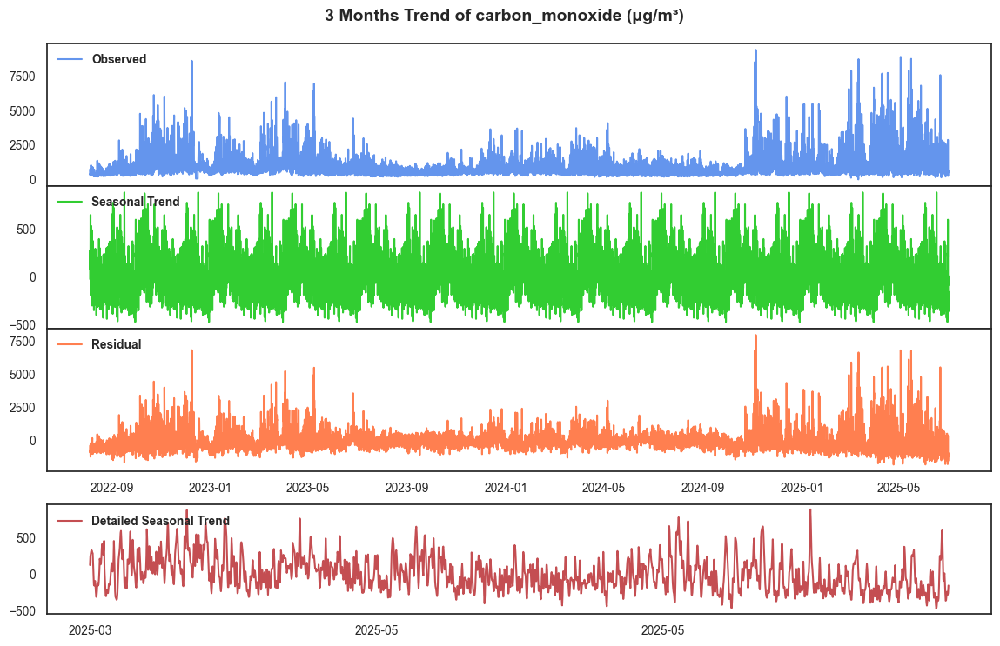

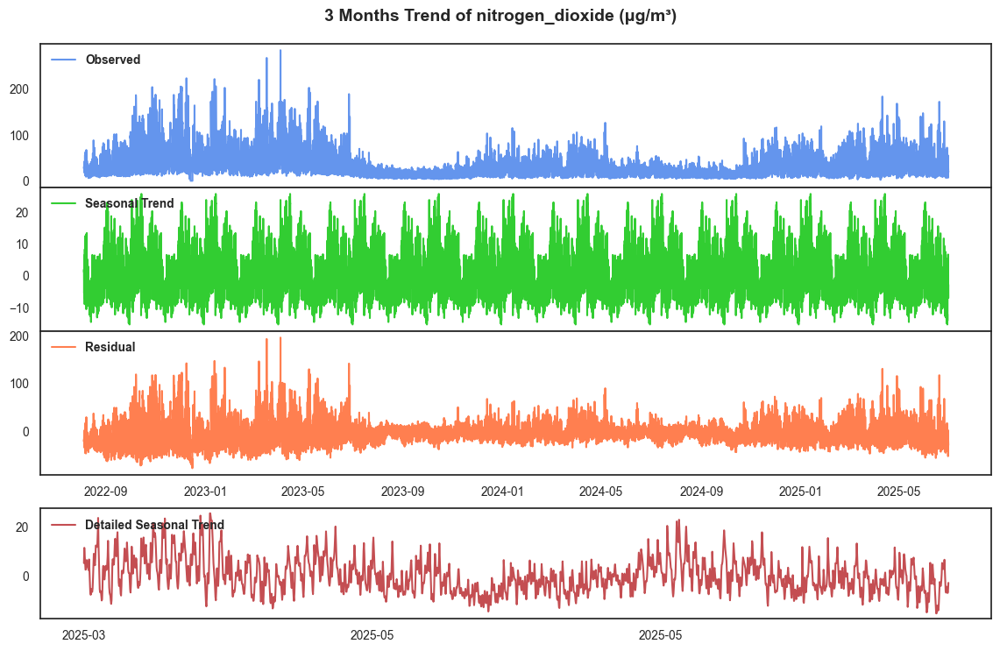

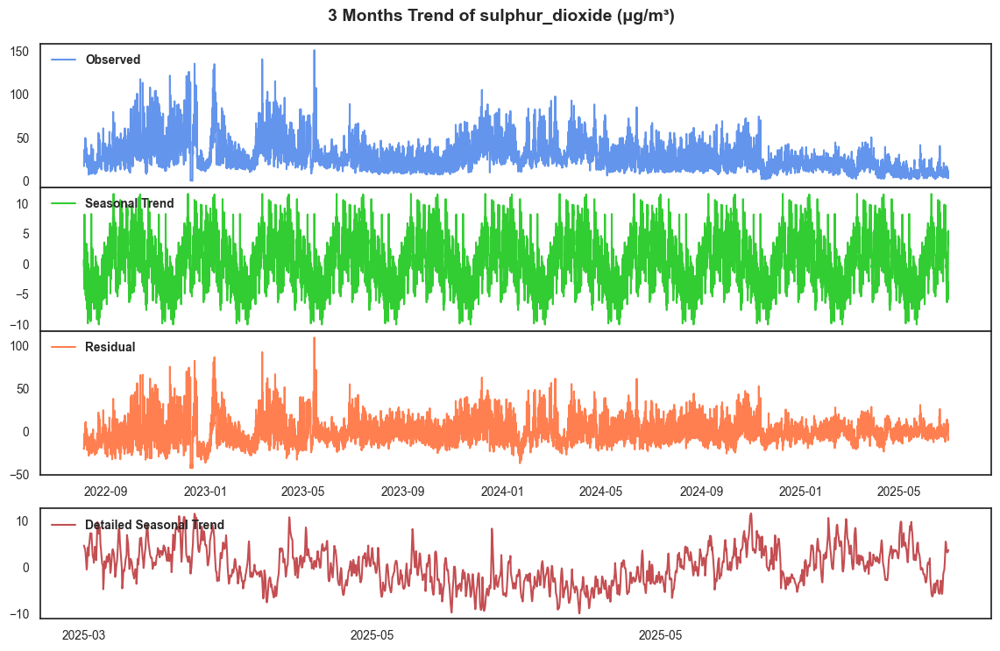

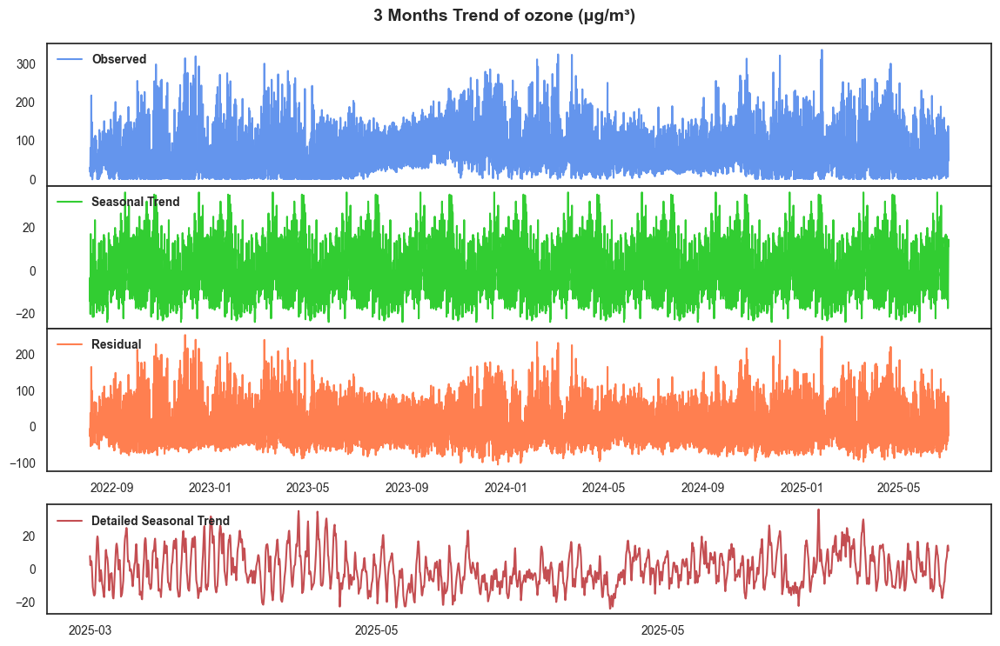

In [22]:
# 3 months seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.M3
)

##### Montly

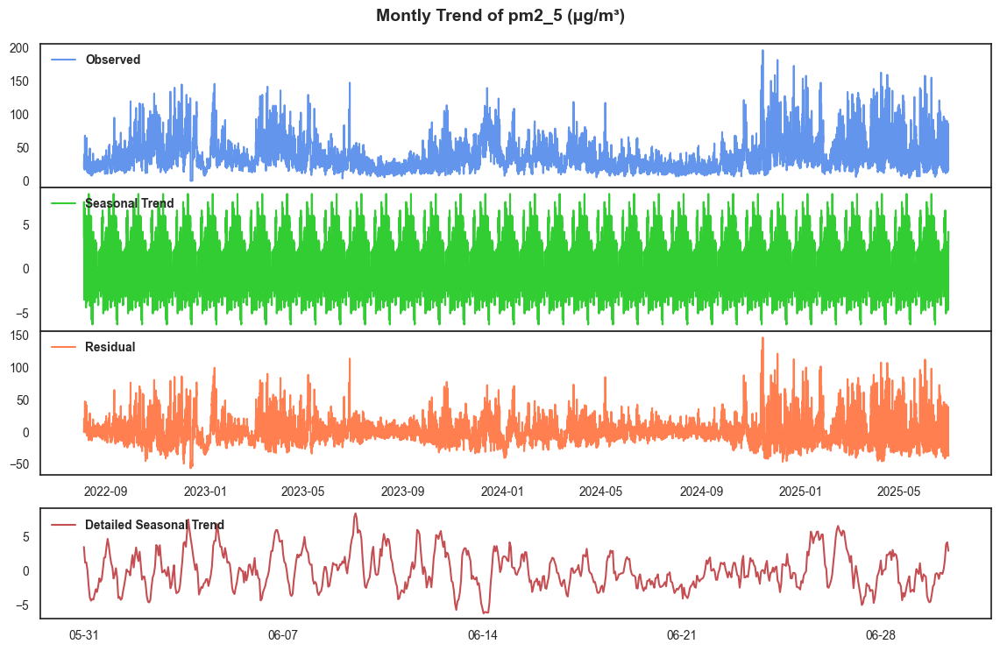

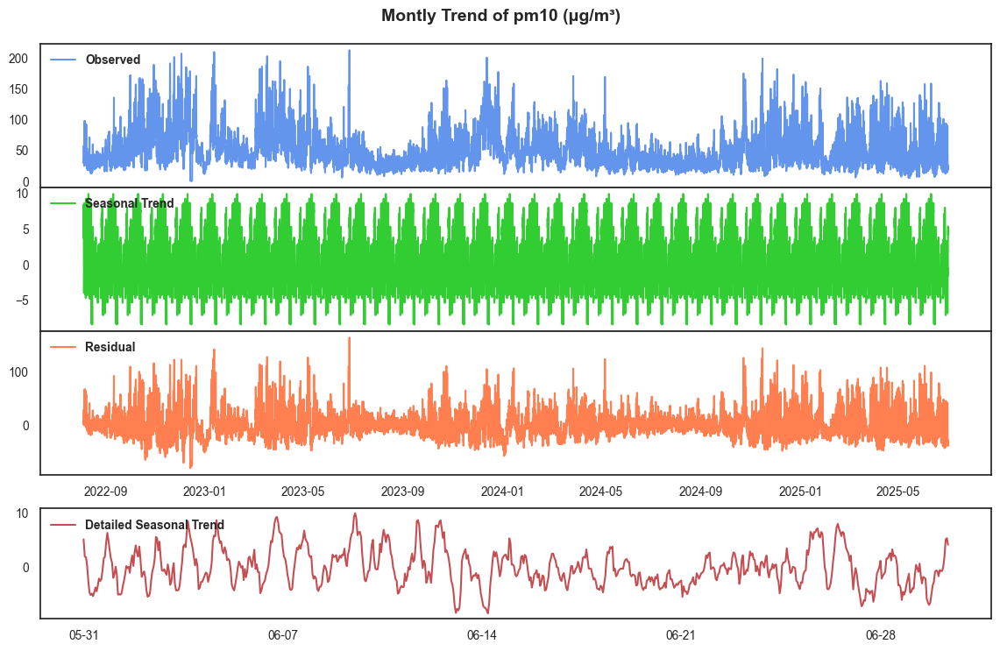

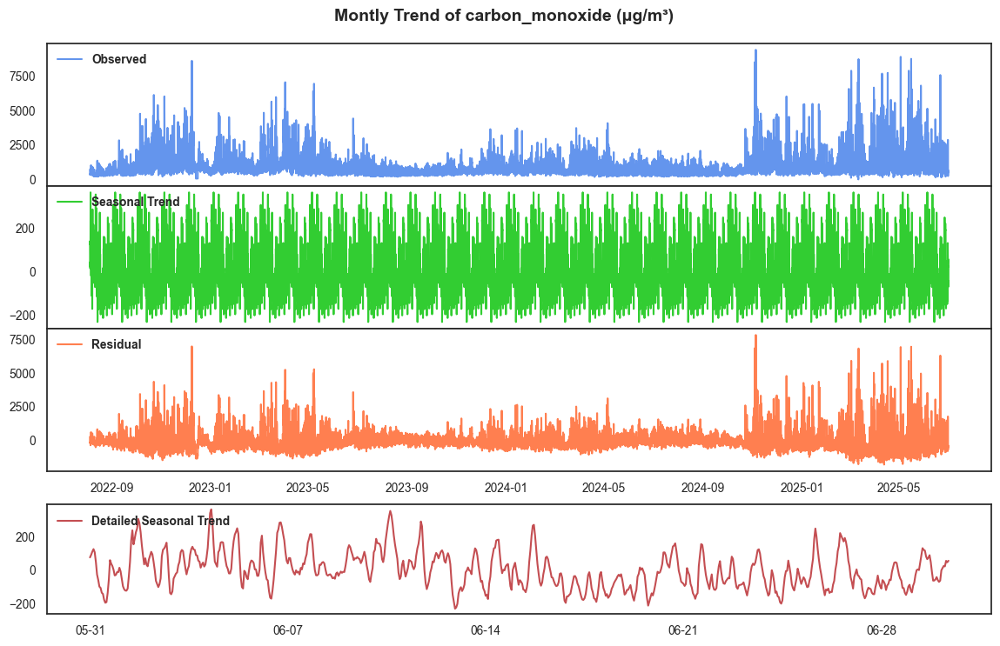

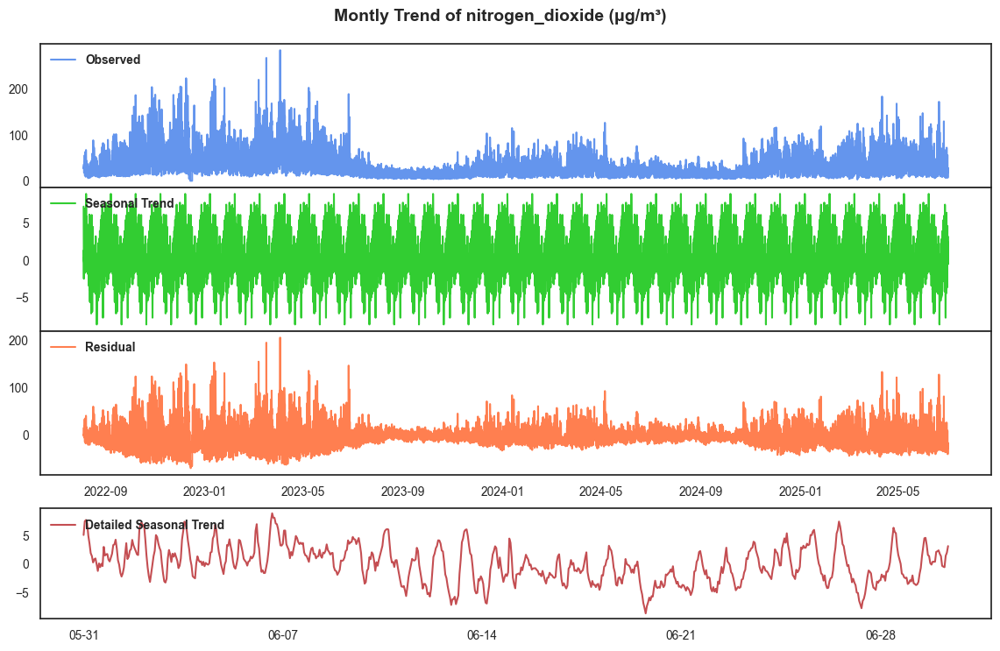

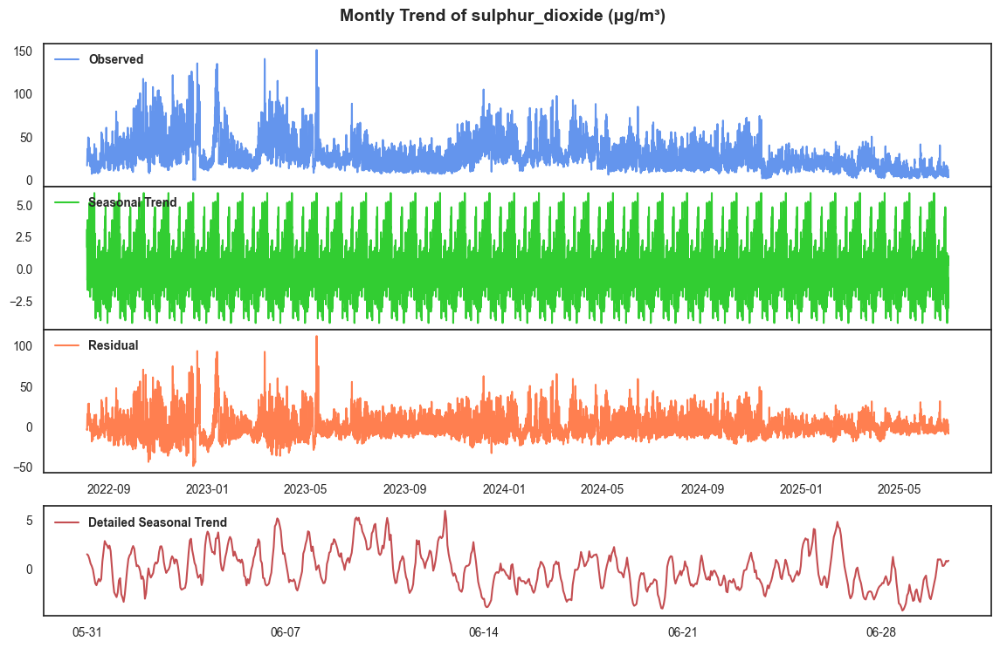

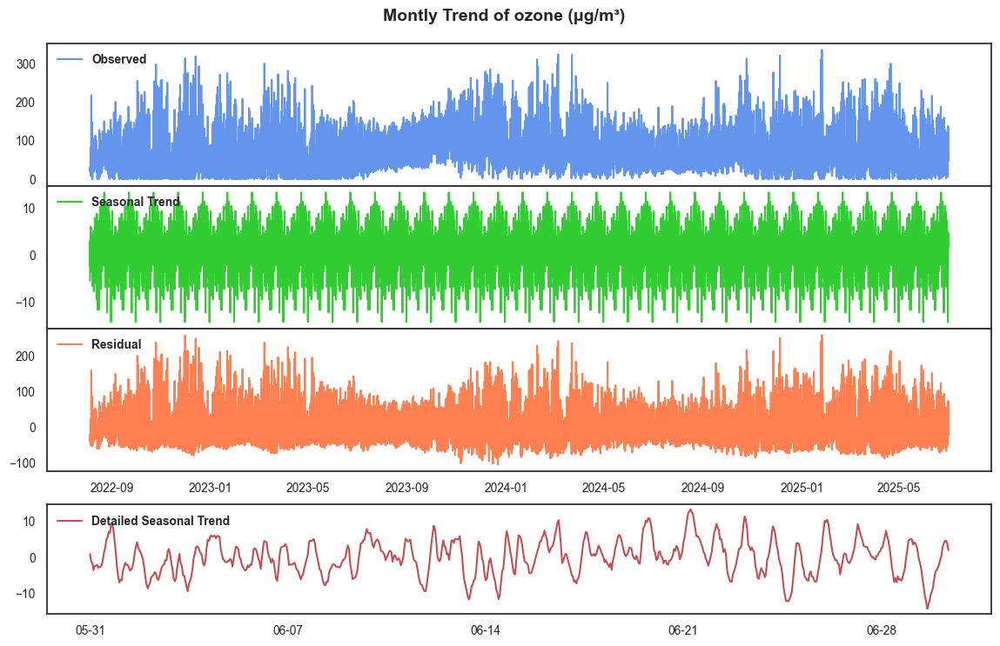

In [23]:
# 1 months seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.M1
)

##### Weekly

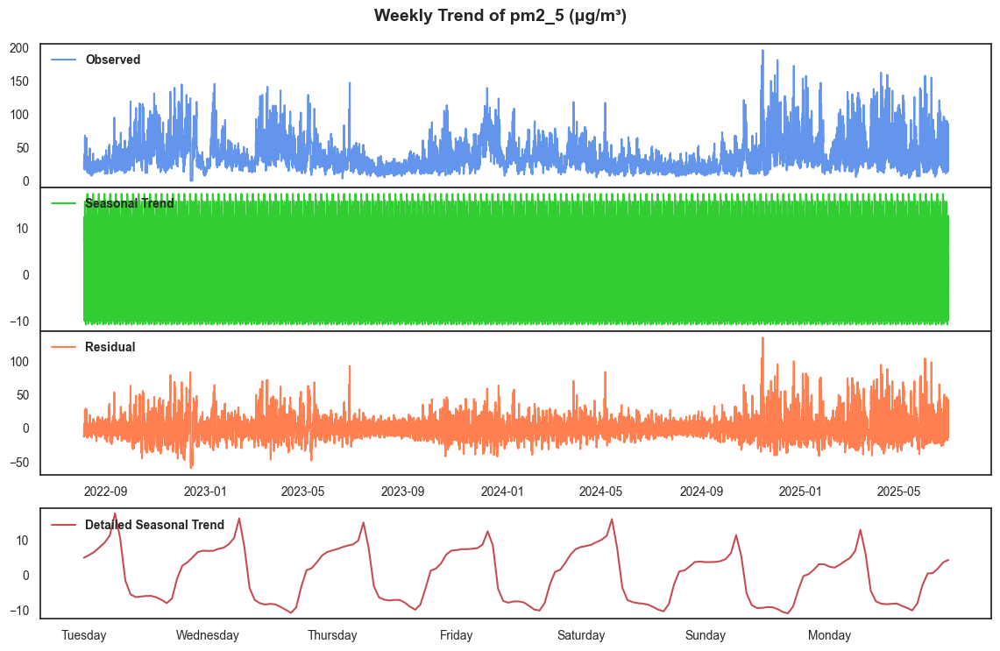

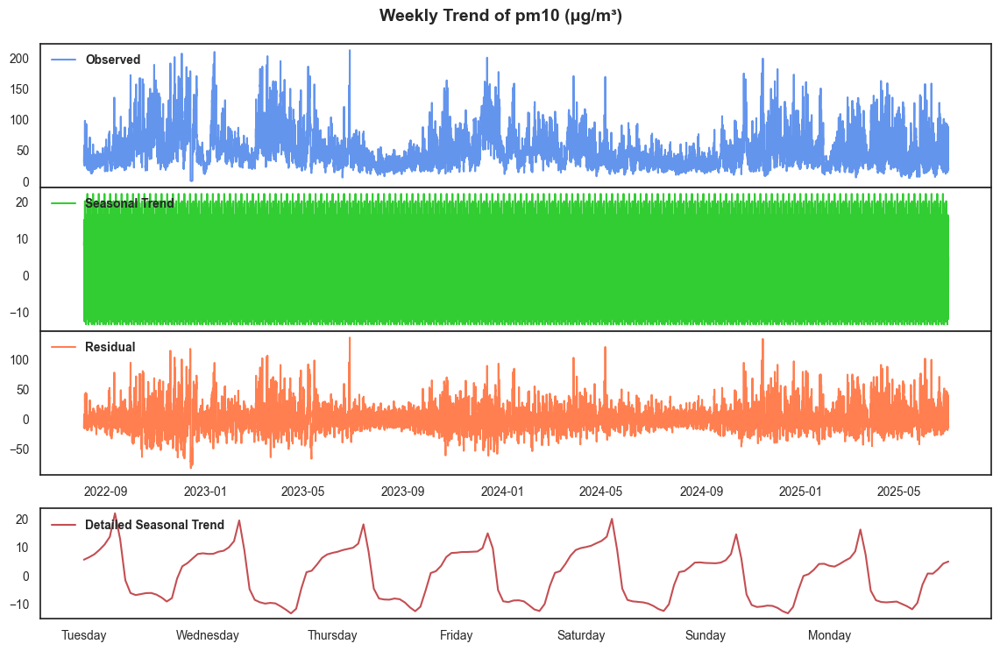

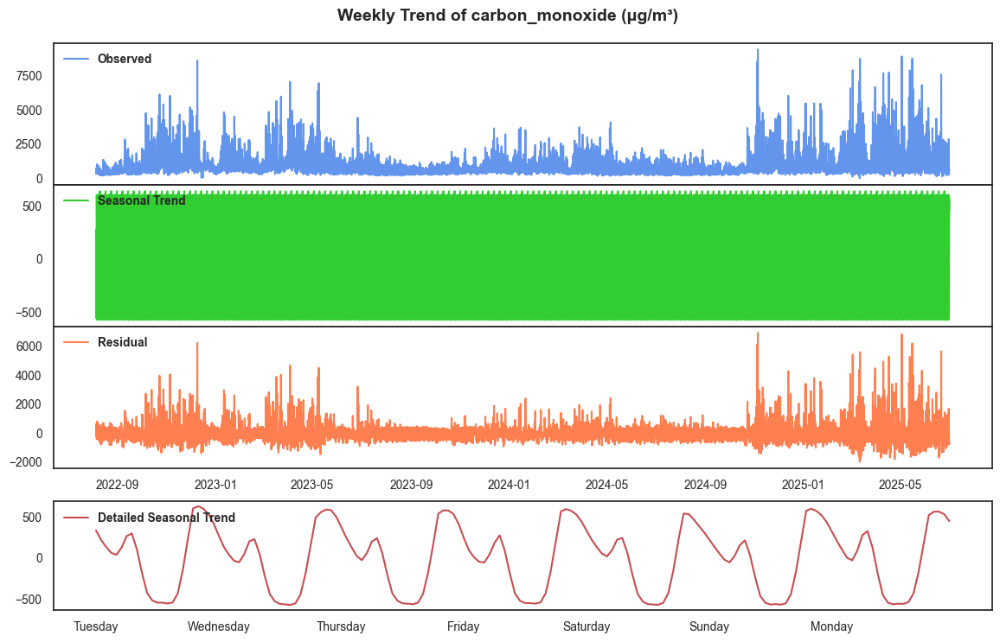

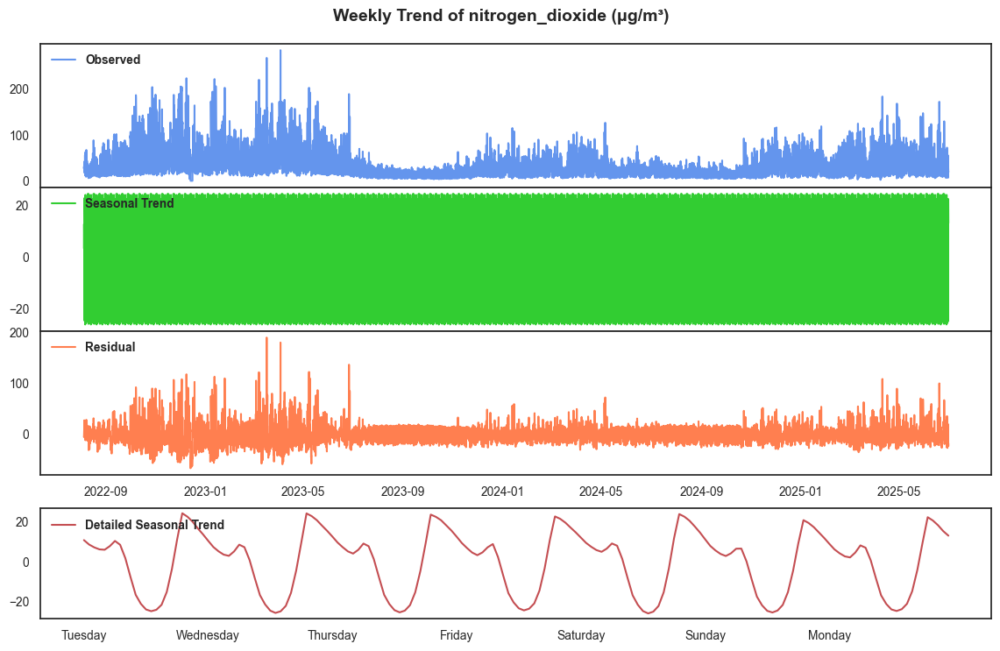

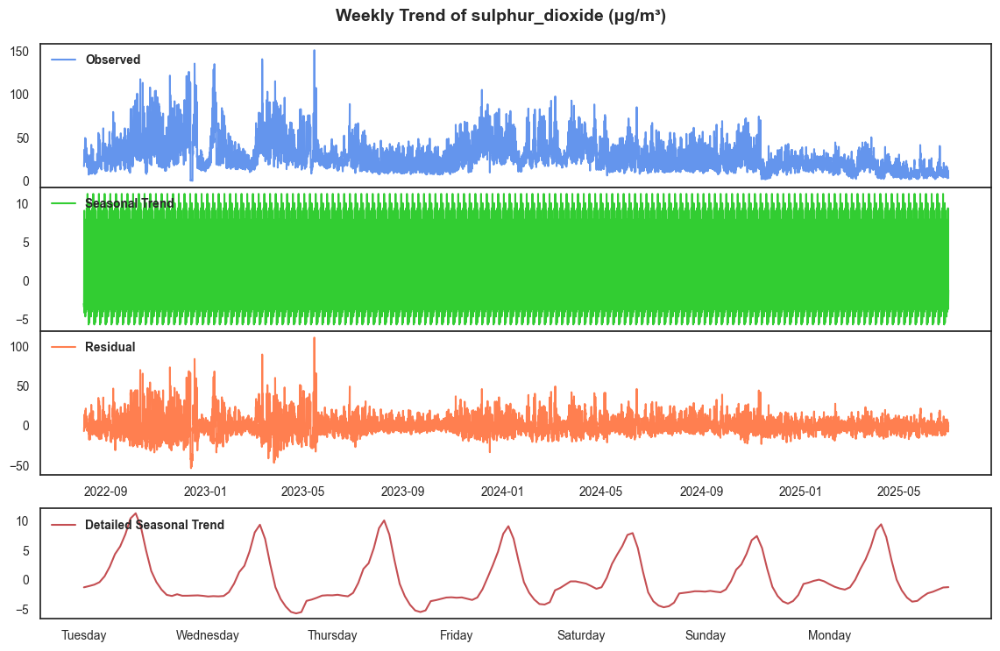

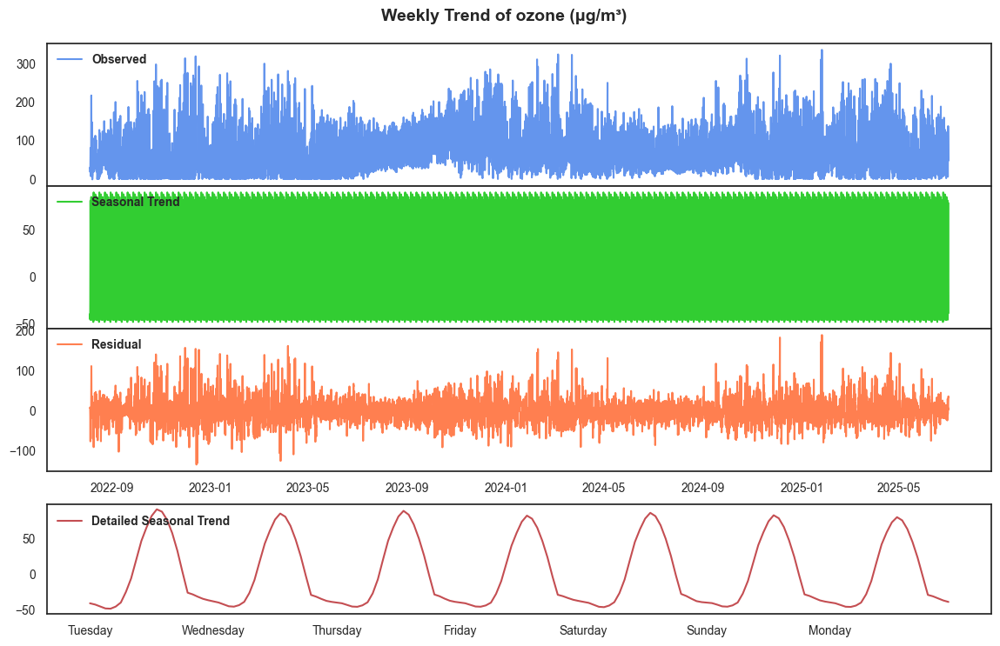

In [24]:
# weekly seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.W1
)

##### Daily

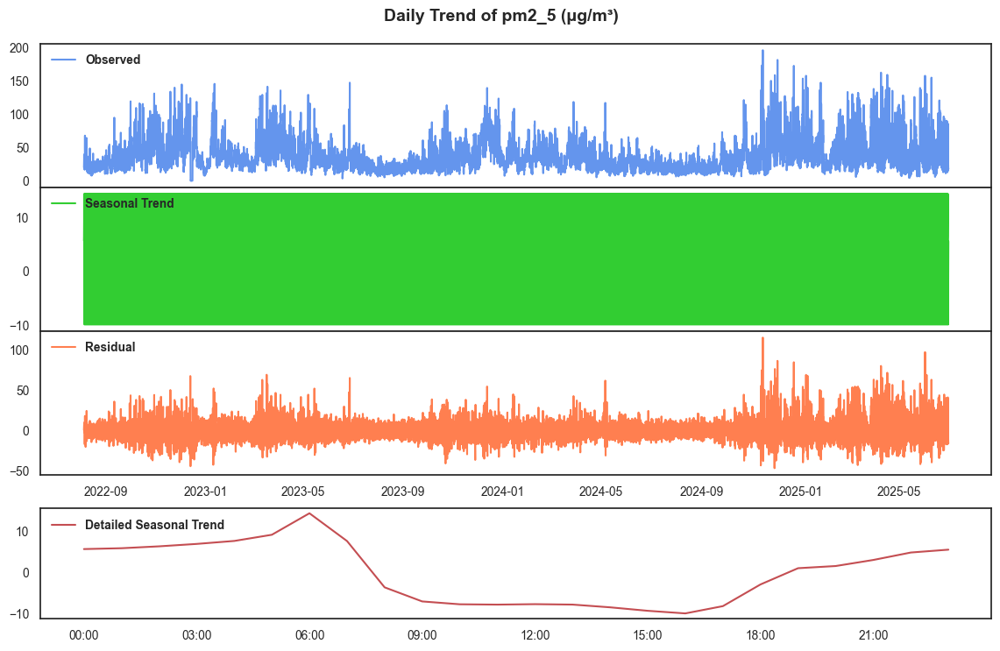

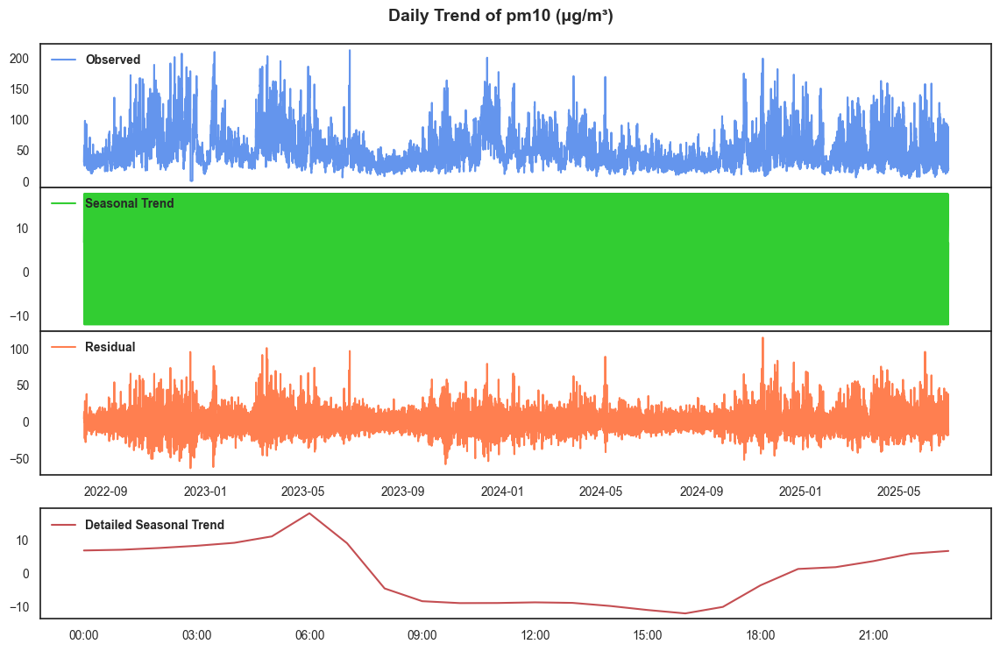

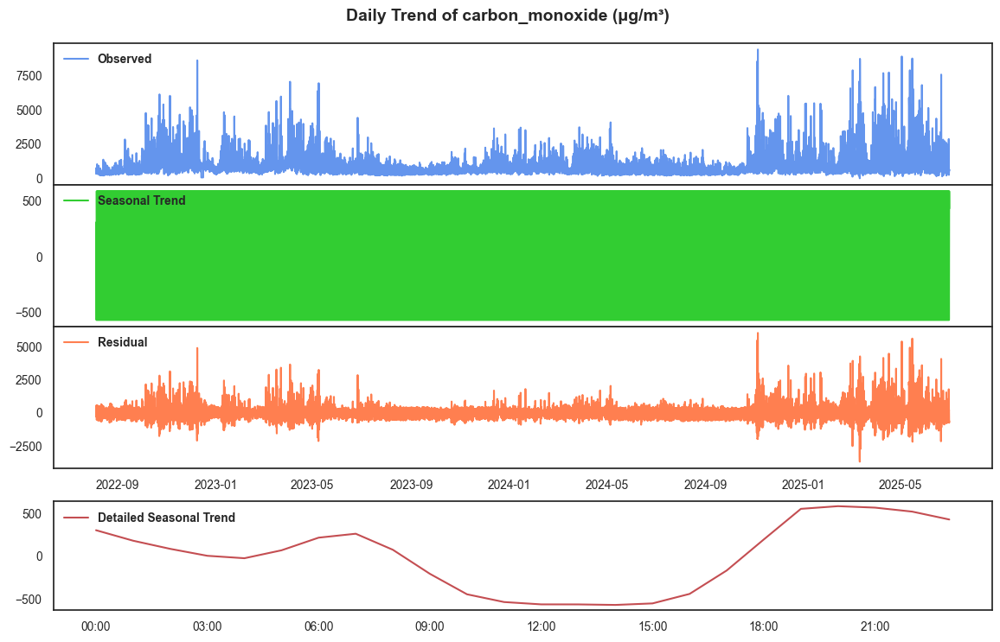

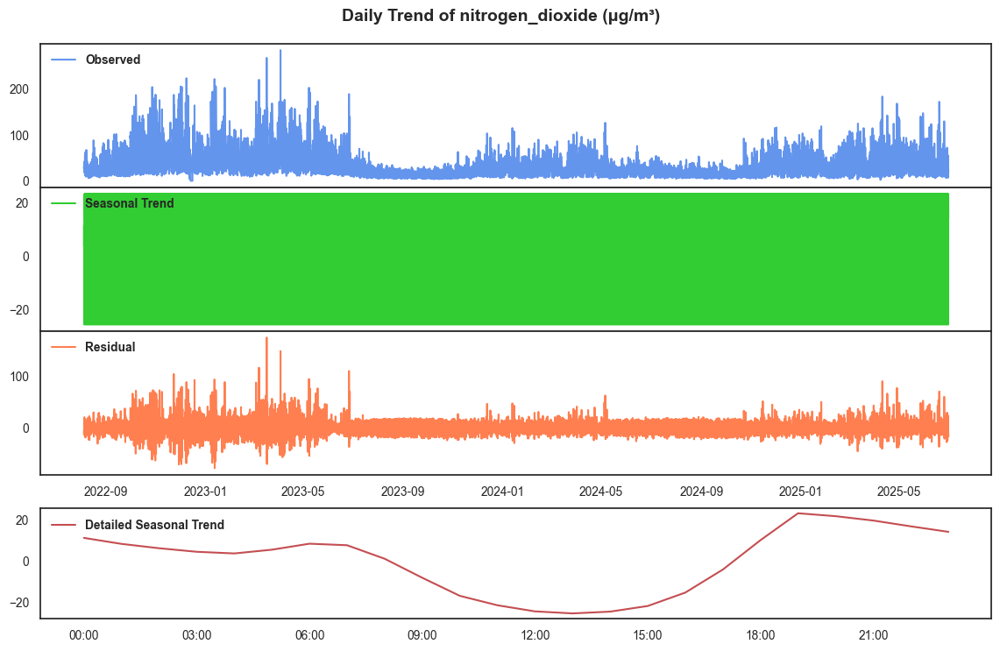

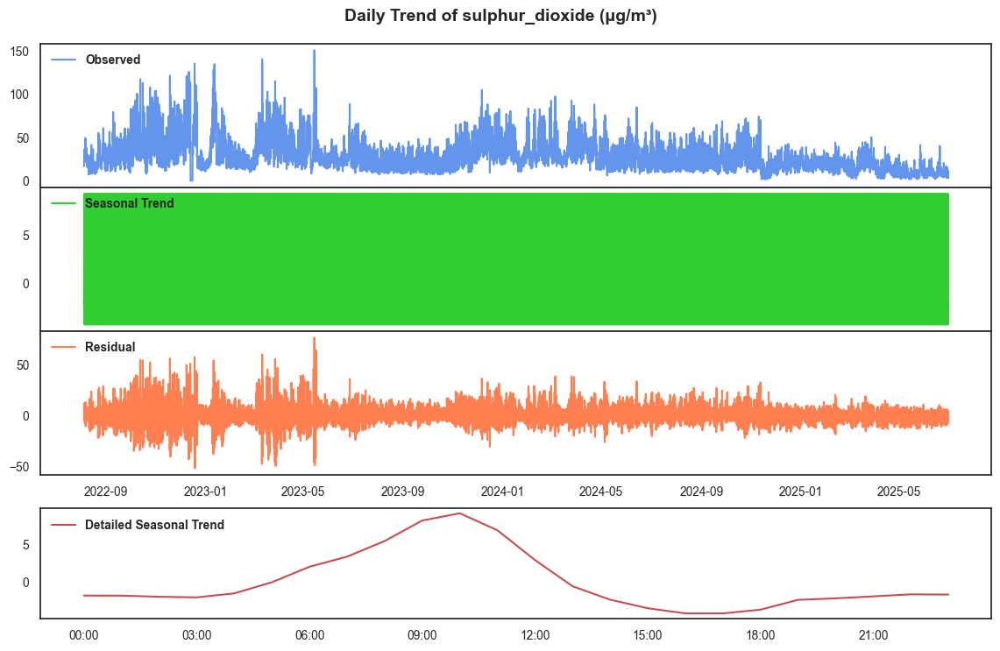

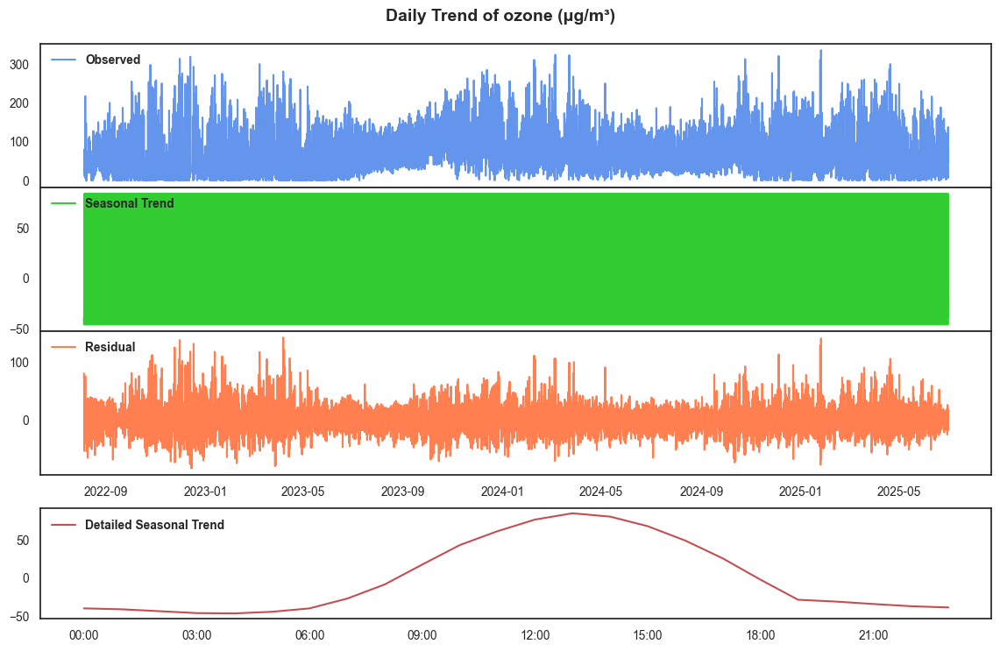

In [25]:
# daily seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.D1
)

### Bivariate Analysis

#### Data Distribution

In [26]:
# Initialize independent columns
independent_cols = df_past_encoded.columns[ColumnGroup.TARGET:]
independent_n = int(len(independent_cols) // 2)

# Check
print('All covariates:',independent_cols)
print('Number of all feature divided by 2:',independent_n)

All covariates: Index(['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8'], dtype='object')
Number of all feature divided by 2: 4


##### PM2.5

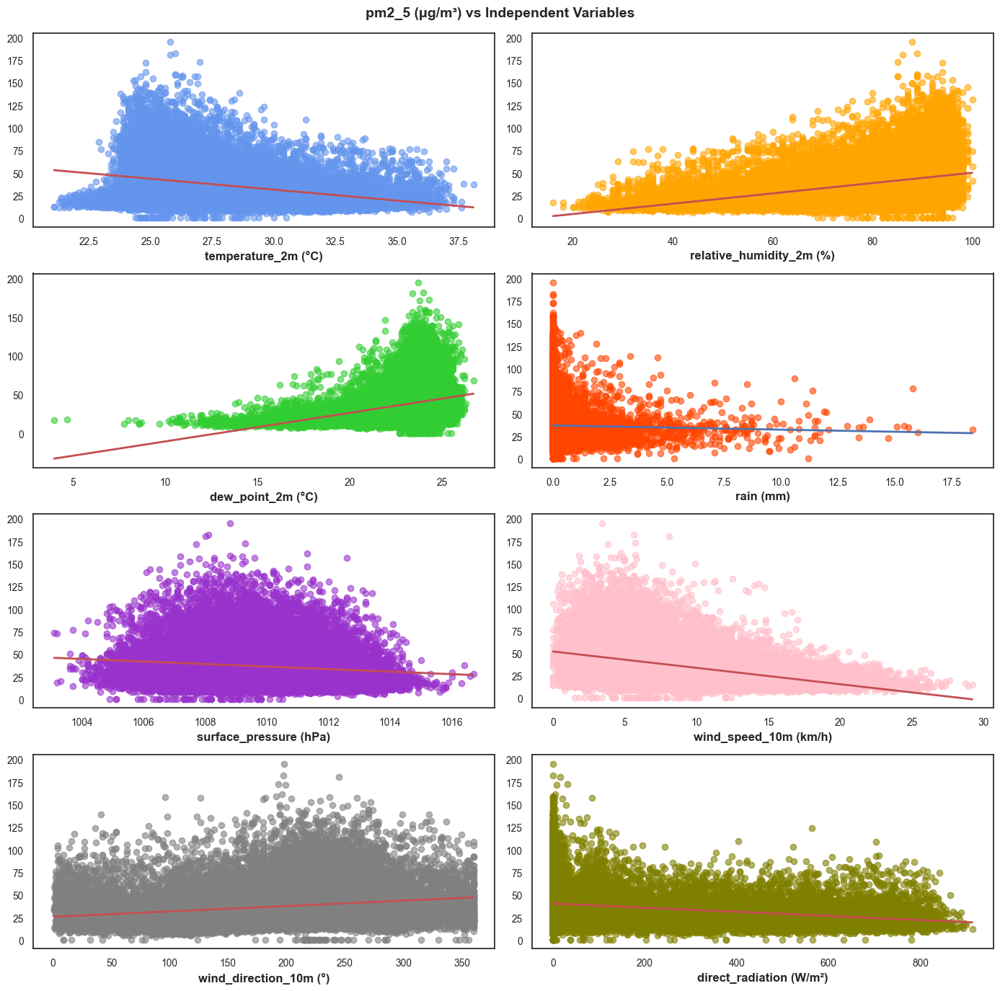

In [27]:
# PM2.5 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y1'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n),
    save_path     = f'../reports/figures/bivariate_analysis/bivariate_y1.png'
)

##### PM10

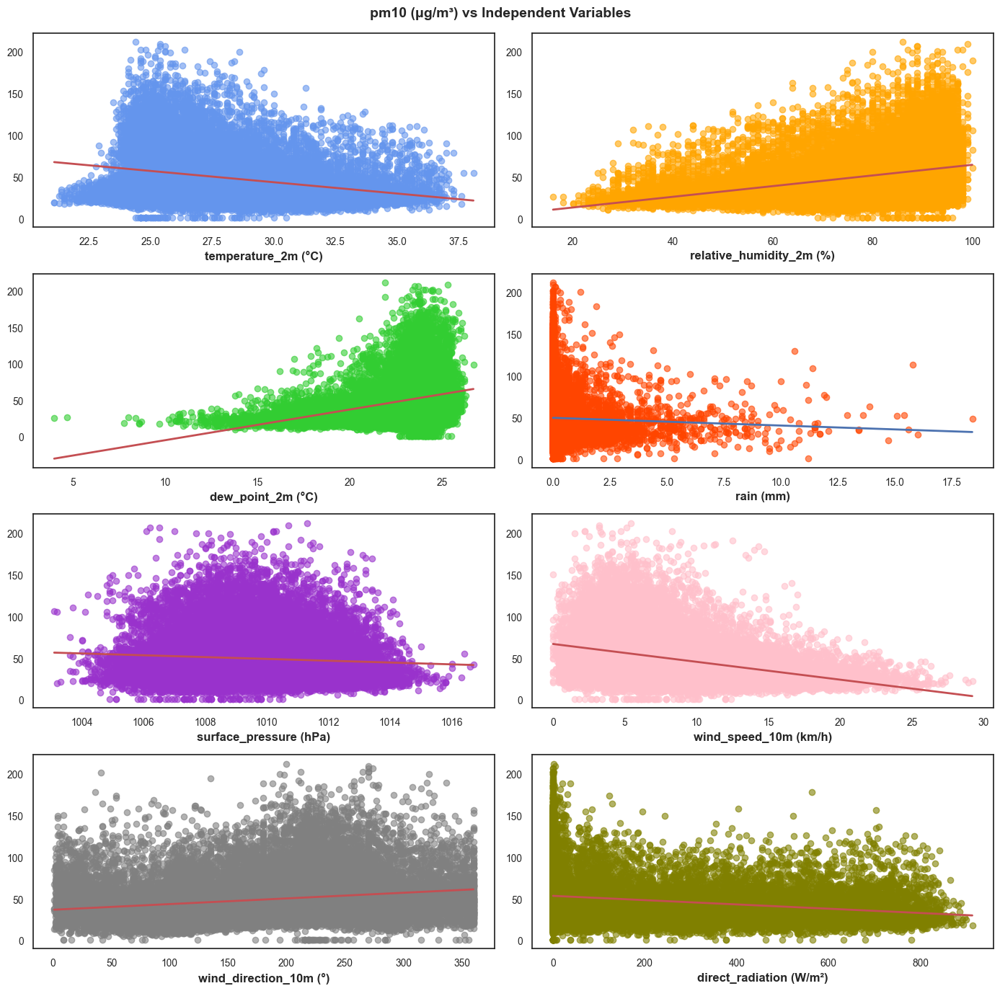

In [28]:
# PM10 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y2'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n),
    save_path     = f'../reports/figures/bivariate_analysis/bivariate_y2.png'
)

##### CO

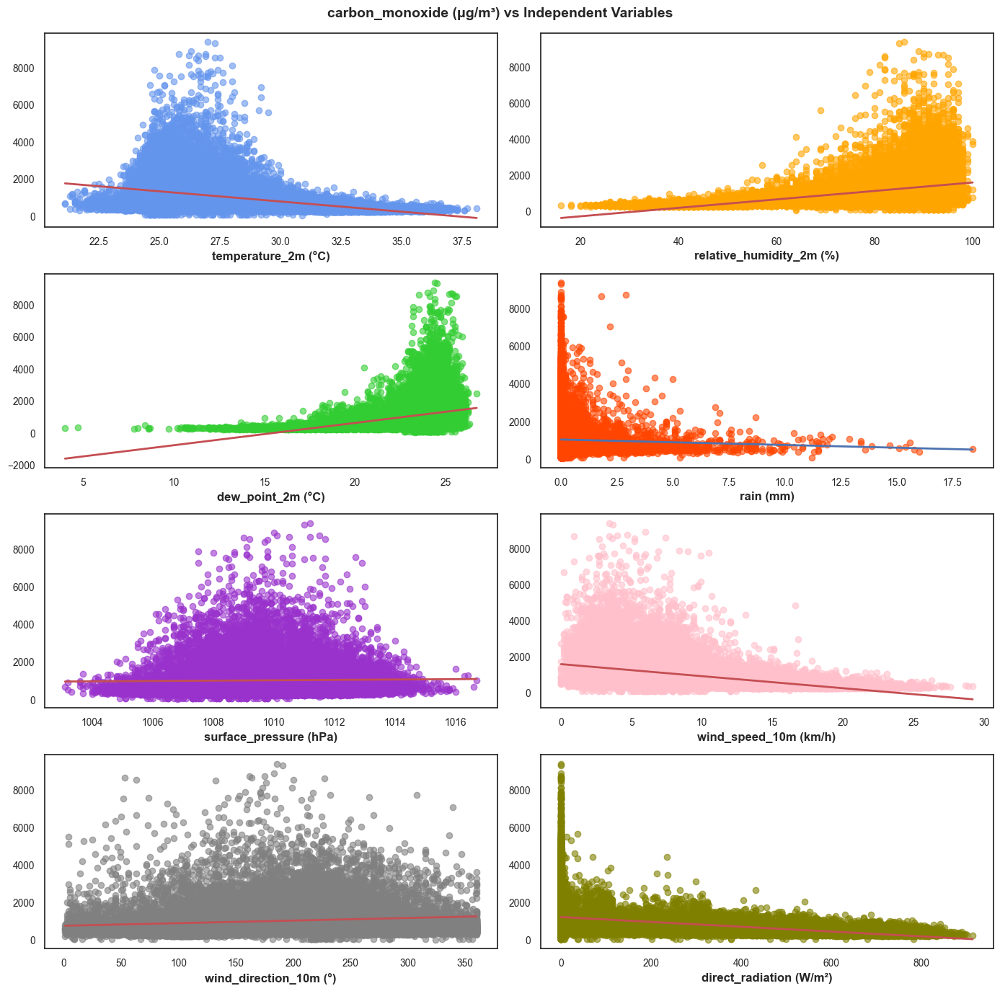

In [29]:
# CO vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y3'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n),
    save_path     = f'../reports/figures/bivariate_analysis/bivariate_y3.png'
)

##### NO2

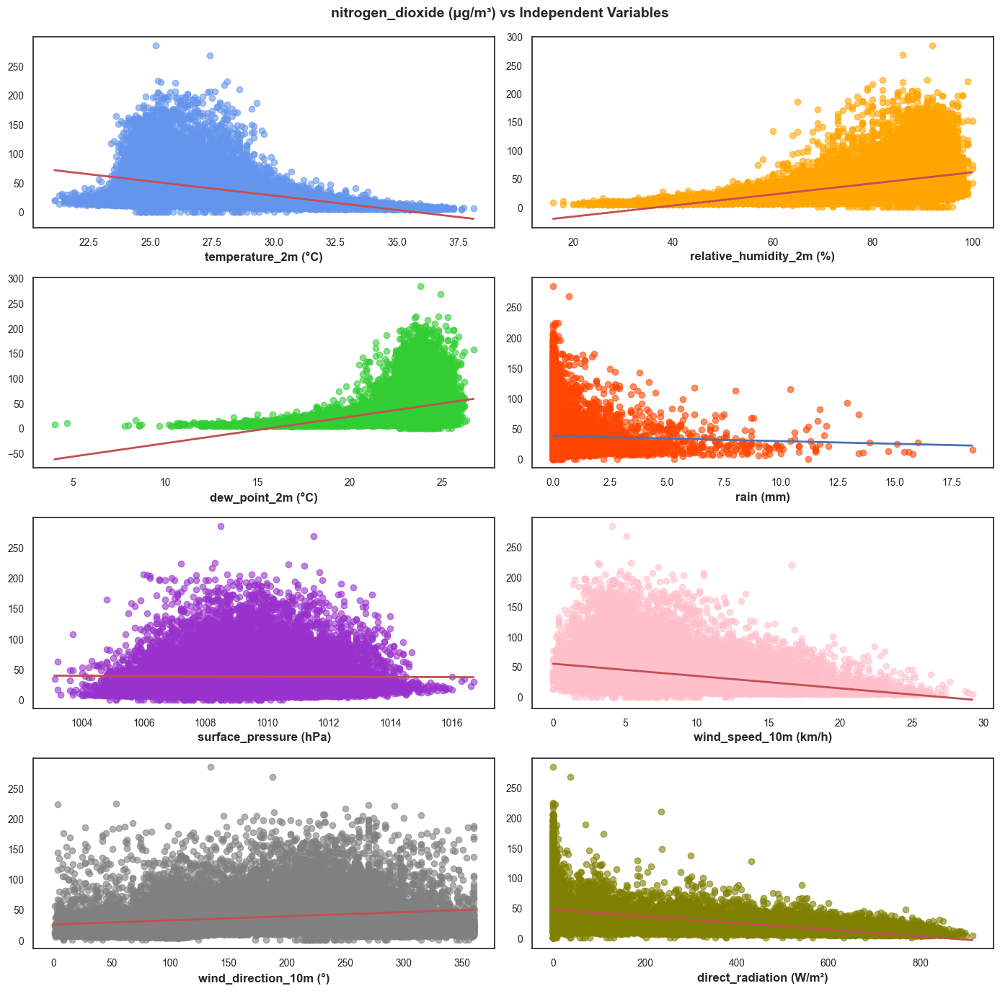

In [30]:
# NO2 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y4'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n),
    save_path     = f'../reports/figures/bivariate_analysis/bivariate_y4.png'
)

##### SO2

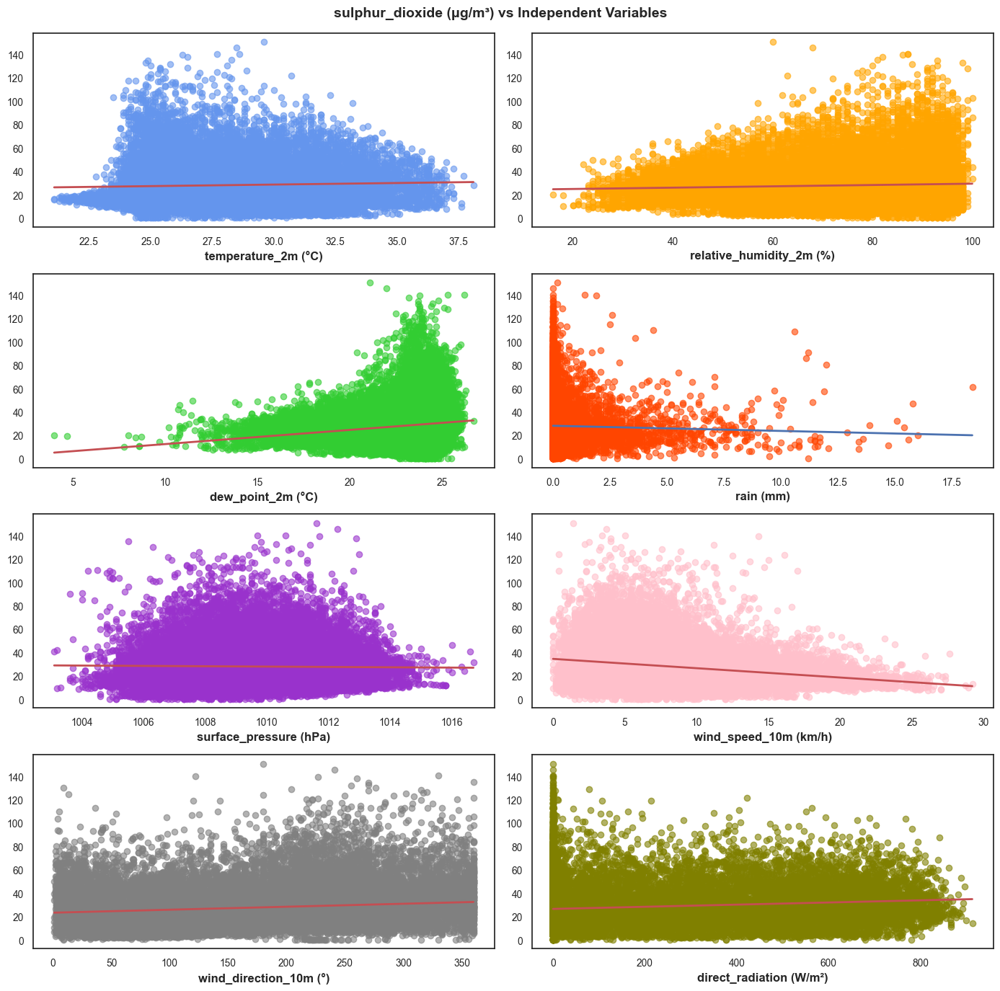

In [31]:
# SO2 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y5'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n),
    save_path     = f'../reports/figures/bivariate_analysis/bivariate_y5.png'
)

##### O3

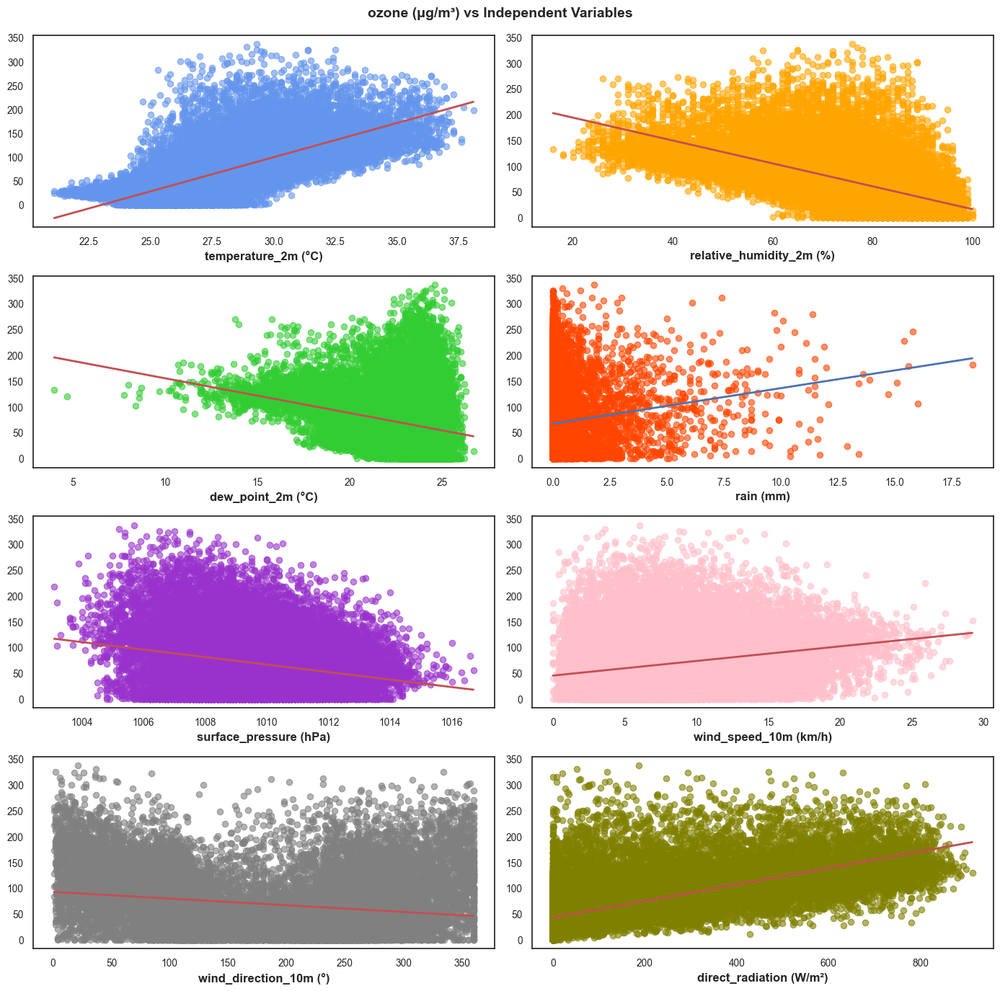

In [32]:
# O3 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y6'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n),
    save_path     = f'../reports/figures/bivariate_analysis/bivariate_y6.png'
)

#### Preparing Input for Correlation

In [33]:
# Split dataset target and features numerical and categorical (categorical max date same as past covariates)
X_num = df_past_encoded[df_past_encoded.columns[ColumnGroup.TARGET:ColumnGroup.NUMERICAL]]
X_cat = df_future_encoded.iloc[:len(df_past_encoded)][df_future_encoded.columns[-ColumnGroup.FEATURE_CATEGORICAL:]]
# Y already defined in Seasonal Decompose

# Check data shape
print('Y shape:', Y.shape)
print('X_num shape:', X_num.shape)
print('X_cat shape:', X_cat.shape,'\n')

print('Y Columns:', Y.columns.tolist())
print('X_num shape:', X_num.columns.tolist())
print('X_cat shape:', X_cat.columns.tolist())

Y shape: (25464, 6)
X_num shape: (25464, 8)
X_cat shape: (25464, 4) 

Y Columns: ['y1', 'y2', 'y3', 'y4', 'y5', 'y6']
X_num shape: ['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8']
X_cat shape: ['x9', 'x10', 'x11', 'x12']


In [34]:
# Create decode columns name
Y     = Y.rename(columns=col_decode).copy()
X_num = X_num.rename(columns=col_decode).copy()
X_cat = X_cat.rename(columns=col_decode).copy()

# Check
print('Y Columns:', Y.columns.tolist(), '\n')
print('X_num Columns:', X_num.columns.tolist(), '\n')
print('X_cat Columns:', X_cat.columns.tolist(), '\n')

Y Columns: ['pm2_5 (μg/m³)', 'pm10 (μg/m³)', 'carbon_monoxide (μg/m³)', 'nitrogen_dioxide (μg/m³)', 'sulphur_dioxide (μg/m³)', 'ozone (μg/m³)'] 

X_num Columns: ['temperature_2m (°C)', 'relative_humidity_2m (%)', 'dew_point_2m (°C)', 'rain (mm)', 'surface_pressure (hPa)', 'wind_speed_10m (km/h)', 'wind_direction_10m (°)', 'direct_radiation (W/m²)'] 

X_cat Columns: ['pembagian_waktu/hari', 'hari_per_minggu', 'hari_libur_nasional', 'musim'] 



#### Pearson Correlation

In [35]:
# Save results correlation
results_r = []

# Iterate though each pair of columns
for y_col in Y.columns:
    for x_col in X_num.columns:
        
        # Calculate Pearson correlation
        r, p_value = pearsonr(X_num[x_col], Y[y_col])
        
        # Store results_r
        results_r.append({
            'Target': y_col,
            'Feature': x_col,
            'Correlation': round(r, 3),
            'P-value': round(p_value, 3)
        })

# Convert result to dataframe
results_r = pd.DataFrame(results_r)

# Show results
print('results_r shape:', results_r.shape)
results_r.head()

results_r shape: (48, 4)


,Target,Feature,Correlation,P-value
0,pm2_5 (μg/m³),temperature_2m (°C),-0.299,0.000
1,pm2_5 (μg/m³),relative_humidity_2m (%),0.400,0.000
2,pm2_5 (μg/m³),dew_point_2m (°C),0.344,0.000
3,pm2_5 (μg/m³),rain (mm),-0.018,0.004
4,pm2_5 (μg/m³),surface_pressure (hPa),-0.116,0.000


In [36]:
# Checking correlation that most close to 0

# Convert negative correlation to absolute value to track closest to 0
results_r['AbsCorr'] = results_r['Correlation'].abs()

# Sort by absolute correlation value in ascending order
results_r = results_r.sort_values('AbsCorr', ascending=False)

# Check results
results_r.head()

,Target,Feature,Correlation,P-value,AbsCorr
40,ozone (μg/m³),temperature_2m (°C),0.708,0.000,0.708
47,ozone (μg/m³),direct_radiation (W/m²),0.667,0.000,0.667
41,ozone (μg/m³),relative_humidity_2m (%),-0.624,0.000,0.624
25,nitrogen_dioxide (μg/m³),relative_humidity_2m (%),0.518,0.000,0.518
24,nitrogen_dioxide (μg/m³),temperature_2m (°C),-0.457,0.000,0.457


In [37]:
# Filter significant correlations (p-value < 0.05)

# Check if any correlation is not significant
results_r_h0 = results_r[results_r['P-value'] >= 0.05]

# Check if any correltion is significant
results_r_h1 = results_r[results_r['P-value'] < 0.05]

In [38]:
# Check results that not significant
print('results_r_h0 shape:', results_r_h0.shape)
results_r_h0.head()

results_r_h0 shape: (1, 5)


,Target,Feature,Correlation,P-value,AbsCorr
28,nitrogen_dioxide (μg/m³),surface_pressure (hPa),-0.012,0.059,0.012


In [39]:
# Check results that is significant
print('results_r_h1 shape:', results_r_h1.shape)
results_r_h1.head()

results_r_h1 shape: (47, 5)


,Target,Feature,Correlation,P-value,AbsCorr
40,ozone (μg/m³),temperature_2m (°C),0.708,0.000,0.708
47,ozone (μg/m³),direct_radiation (W/m²),0.667,0.000,0.667
41,ozone (μg/m³),relative_humidity_2m (%),-0.624,0.000,0.624
25,nitrogen_dioxide (μg/m³),relative_humidity_2m (%),0.518,0.000,0.518
24,nitrogen_dioxide (μg/m³),temperature_2m (°C),-0.457,0.000,0.457


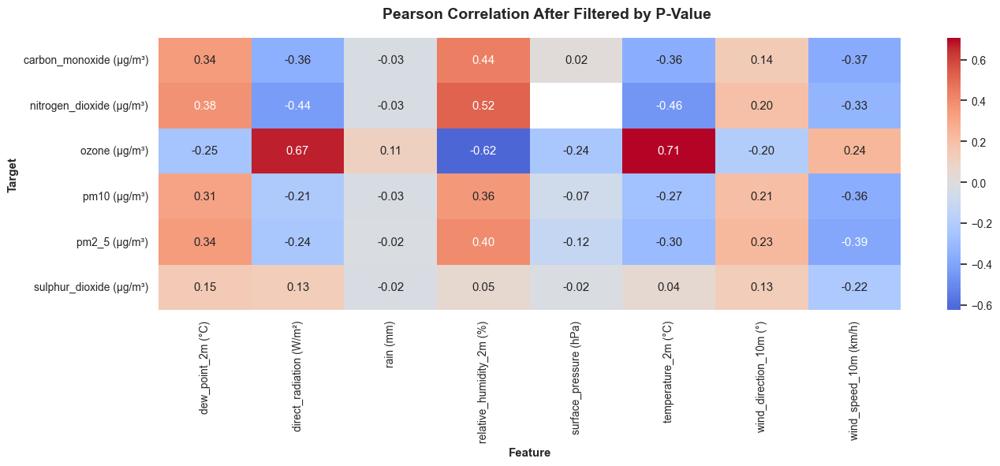

In [40]:
# Data distribution with Pearson Correlation
correlation_heatmap(
    df        = results_r_h1,
    method    = 'pearson',
    title     = 'Pearson Correlation After Filtered by P-Value',
    save_path = '../reports/figures/bivariate_analysis/heatmap_pearson_filtered.png'
)

In [41]:
# Calculate mean absolute correlation for each feature
results_r = results_r_h1['Correlation'].abs().groupby(results_r_h1['Feature']).mean().sort_values(ascending=False)
results_r

Feature
relative_humidity_2m (%)   0.399
temperature_2m (°C)        0.356
direct_radiation (W/m²)    0.339
wind_speed_10m (km/h)      0.319
dew_point_2m (°C)          0.296
wind_direction_10m (°)     0.182
surface_pressure (hPa)     0.093
rain (mm)                  0.039
Name: Correlation, dtype: float64

#### Spearman Correlation

In [42]:
# Save results correlation
results_rs = []

# Iterate though each pair of columns
for y_col in Y.columns:
    for x_col in X_cat.columns:
        
        # Calculate Pearson correlation
        r, p_value = spearmanr(X_cat[x_col], Y[y_col])
        
        # Store results_rs
        results_rs.append({
            'Target': y_col,
            'Feature': x_col,
            'Correlation': round(r, 3),
            'P-value': round(p_value, 3)
        })

# Convert result to dataframe
results_rs = pd.DataFrame(results_rs)

# Show results
print('results_rs shape:', results_rs.shape)
results_rs.head()

results_rs shape: (24, 4)


,Target,Feature,Correlation,P-value
0,pm2_5 (μg/m³),pembagian_waktu/hari,0.075,0.000
1,pm2_5 (μg/m³),hari_per_minggu,-0.017,0.008
2,pm2_5 (μg/m³),hari_libur_nasional,0.002,0.718
3,pm2_5 (μg/m³),musim,0.307,0.000
4,pm10 (μg/m³),pembagian_waktu/hari,0.075,0.000


In [43]:
# Checking correlation that most close to 0

# Copy dataframe first
results_rs = results_rs.copy()

# Convert negative correlation to absolute value to track closest to 0
results_rs['AbsCorr'] = results_rs['Correlation'].abs()

# Sort by absolute correlation value in ascending order
results_rs = results_rs.sort_values('AbsCorr', ascending=False)

# Check results
results_rs.head()

,Target,Feature,Correlation,P-value,AbsCorr
20,ozone (μg/m³),pembagian_waktu/hari,-0.383,0.000,0.383
3,pm2_5 (μg/m³),musim,0.307,0.000,0.307
7,pm10 (μg/m³),musim,0.298,0.000,0.298
12,nitrogen_dioxide (μg/m³),pembagian_waktu/hari,0.250,0.000,0.250
19,sulphur_dioxide (μg/m³),musim,0.216,0.000,0.216


In [44]:
# Filter significant correlations (p-value < 0.05)

# Check if any correlation is not significant
results_rs_h0 = results_rs[results_rs['P-value'] >= 0.05]

# Check if any correltion is significant
results_rs_h1 = results_rs[results_rs['P-value'] < 0.05]

In [45]:
# Check results that not significant
print('results_rs_h0 shape:', results_rs_h0.shape)
results_rs_h0

results_rs_h0 shape: (6, 5)


,Target,Feature,Correlation,P-value,AbsCorr
10,carbon_monoxide (μg/m³),hari_libur_nasional,0.011,0.067,0.011
13,nitrogen_dioxide (μg/m³),hari_per_minggu,-0.007,0.268,0.007
6,pm10 (μg/m³),hari_libur_nasional,-0.006,0.343,0.006
2,pm2_5 (μg/m³),hari_libur_nasional,0.002,0.718,0.002
21,ozone (μg/m³),hari_per_minggu,-0.002,0.715,0.002
18,sulphur_dioxide (μg/m³),hari_libur_nasional,-0.001,0.883,0.001


In [46]:
# Check results that is significant
print('results_rs_h1 shape:', results_rs_h1.shape)
results_rs_h1.head()

results_rs_h1 shape: (18, 5)


,Target,Feature,Correlation,P-value,AbsCorr
20,ozone (μg/m³),pembagian_waktu/hari,-0.383,0.000,0.383
3,pm2_5 (μg/m³),musim,0.307,0.000,0.307
7,pm10 (μg/m³),musim,0.298,0.000,0.298
12,nitrogen_dioxide (μg/m³),pembagian_waktu/hari,0.250,0.000,0.250
19,sulphur_dioxide (μg/m³),musim,0.216,0.000,0.216


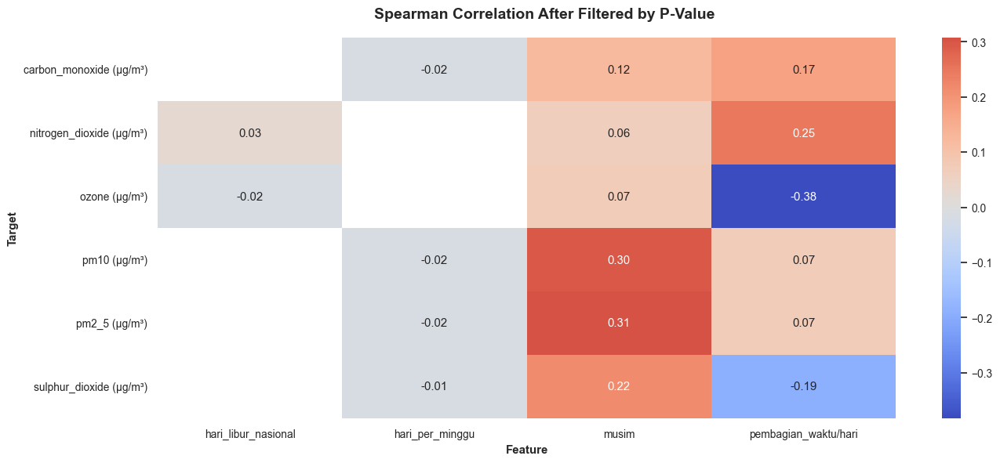

In [47]:
# Data distribution with Pearson Correlation
correlation_heatmap(
    df        = results_rs_h1,
    method    = 'spearman',
    title     = 'Spearman Correlation After Filtered by P-Value',
    save_path = '../reports/figures/bivariate_analysis/heatmap_spearman_filtered.png'
)

In [48]:
results_rs = results_rs_h1['Correlation'].abs().groupby(results_rs_h1['Feature']).mean().sort_values(ascending=False)
results_rs

Feature
pembagian_waktu/hari   0.191
musim                  0.180
hari_libur_nasional    0.021
hari_per_minggu        0.017
Name: Correlation, dtype: float64

#### Feature Selection

In [49]:
# Check overall correlation score for numerical columns
results_r

Feature
relative_humidity_2m (%)   0.399
temperature_2m (°C)        0.356
direct_radiation (W/m²)    0.339
wind_speed_10m (km/h)      0.319
dew_point_2m (°C)          0.296
wind_direction_10m (°)     0.182
surface_pressure (hPa)     0.093
rain (mm)                  0.039
Name: Correlation, dtype: float64

In [50]:
# Take very low correlation level (0.00 - 0.199) to drop
results_r = results_r.reset_index()
X_num_drop = results_r[results_r['Correlation'] <= 0.199]['Feature'].to_list()
X_num_drop

['wind_direction_10m (°)', 'surface_pressure (hPa)', 'rain (mm)']

In [51]:
# Drop columns
X_num = X_num.drop(columns=X_num_drop)
X_num.head()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),wind_speed_10m (km/h),direct_radiation (W/m²)
t,,,,,
2022-08-05 00:00:00,25.600,82.000,22.300,6.400,0.000
2022-08-05 01:00:00,25.100,79.000,21.300,9.000,0.000
2022-08-05 02:00:00,24.300,81.000,20.800,7.600,0.000
2022-08-05 03:00:00,23.900,82.000,20.600,6.300,0.000
2022-08-05 04:00:00,23.400,85.000,20.700,4.100,0.000


# Optimizing Data for More Robust Prediction

Optimize past dataset
1. Transform targeted variables to sqrt or log1p scaling
2. Transform rain feature to binary
3. Transform sind direction feature to sin-cos encoding
4. Transform direct radiation feature to binary
5. Transform humidity to MinMaxScaler()

Optimize future dataset
1. Transform pembagian_waktu/hari to sin-cos encoding
2. Transform hari_per_minggu to sin-cos encoding
3. Transform hari_libur to one hot encoding
4. Transform musim to sin-cos encoding


In [52]:
# Check df_past
df_past_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
y2,25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
y3,25464.000,1010.616,870.051,0.000,481.000,738.000,1200.000,9391.000
y4,25464.000,38.159,30.539,0.000,16.700,28.300,51.100,284.800
y5,25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
y6,25464.000,68.488,57.695,-1.000,23.000,53.000,105.000,337.000
x1,25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
x2,25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
x3,25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


In [53]:
# Remove negatif value
df_past_encoded = df_past_encoded.clip(lower=0)
df_past_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
y2,25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
y3,25464.000,1010.616,870.051,0.000,481.000,738.000,1200.000,9391.000
y4,25464.000,38.159,30.539,0.000,16.700,28.300,51.100,284.800
y5,25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
y6,25464.000,68.489,57.695,0.000,23.000,53.000,105.000,337.000
x1,25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
x2,25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
x3,25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


## SQRT Transform

In [54]:
# Transform target feature into sqrt
cols_transform = ['y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'x1', 'x3', 'x5', 'x6']
cols_minmax = ['x2']
cols_sincos = ['x7']
cols_onehot_rain = ['x4']
cols_onehot_direc_tradiation = ['x8']

df_sqrt = df_past_encoded.copy()

# Apply SQRT transform to targeted feature
df_sqrt = sqrt_transform(
    df   = df_sqrt,
    cols = cols_transform
)

# Apply MinMaxScaler transform 
df_sqrt = minmax_transform(
    df   = df_sqrt,
    cols = cols_minmax
)

# Apply Sin-Cos Encoding transform
df_sqrt = sincos_transform(
    df     = df_sqrt,
    cols   = cols_sincos,
    period = 360
)

# Applay 
df_sqrt = onehot_transform(
    df        = df_sqrt,
    cols      = cols_onehot_rain,
    threshold = 0.0
)
df_sqrt = onehot_transform(
    df        = df_sqrt,
    cols      = cols_onehot_direc_tradiation,
    threshold = 5.0
)

# Drop columns
df_sqrt = df_sqrt.drop(columns=['x4', 'x7', 'x8'])

# Save as CSV
df_sqrt.to_csv('../data/processed/past_covariates_sqrt_transform.csv', index=True)

# Save as CSV without Ozon
df_sqrt2 = df_sqrt.copy()
df_sqrt2 = df_sqrt2.drop(columns=['y6'])
df_sqrt2.to_csv('../data/processed/past_covariates_sqrt_transform_NoOzon.csv', index=True)

df_sqrt.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,5.832,1.754,0.707,4.517,5.532,6.841,13.986
y2,25464.000,6.772,1.917,0.894,5.348,6.450,7.931,14.571
y3,25464.000,29.782,11.120,0.000,21.932,27.166,34.641,96.907
y4,25464.000,5.756,2.242,0.000,4.087,5.320,7.148,16.876
y5,25464.000,5.080,1.542,0.447,3.987,4.879,6.008,12.284
y6,25464.000,7.386,3.733,0.000,4.796,7.280,10.247,18.358
x1,25464.000,5.270,0.266,4.593,5.060,5.215,5.450,6.173
x2,25464.000,0.720,0.193,0.000,0.619,0.762,0.881,1.000
x3,25464.000,4.774,0.238,2.000,4.712,4.848,4.919,5.167
x5,25464.000,31.776,0.030,31.672,31.755,31.776,31.798,31.886


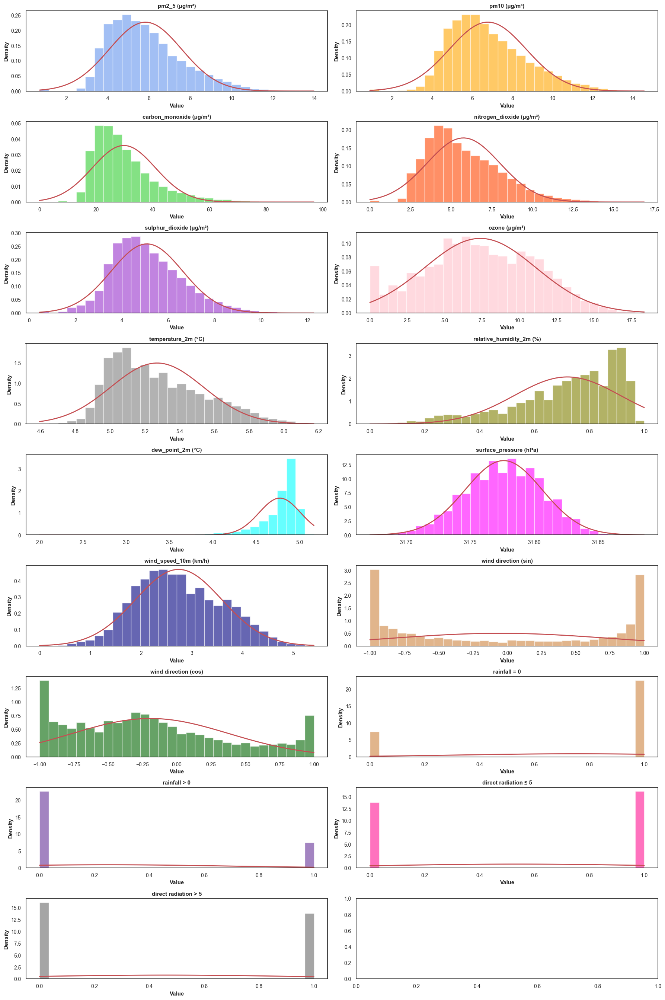

In [55]:
# Data distribution with histplot
univariate_analysis(
    df            = df_sqrt, 
    plot_type     = 'histplot', 
    col_decode    = col_decode, 
    nrows         = int(18 / 2), 
    ncols         = 2, 
    figsize       = (18, int(18 * 1.5)),
    color_variant = color_variant,
    group         = 18,
    save_path     = '../reports/figures/univariate_analysis/sqrt_histplot_all_columns.png'
)

## LOG1P Transform

In [56]:
# Apply LOG1P transform to targeted feature
df_log = df_past_encoded.copy()

df_log = log1p_transform(
    df   = df_log,
    cols = cols_transform
)

# Apply MinMaxScaler transform 
df_log = minmax_transform(
    df   = df_log,
    cols = cols_minmax
)

# Apply Sin-Cos Encoding transform
df_log = sincos_transform(
    df     = df_log,
    cols   = cols_sincos,
    period = 360
)

# Apply One-Hot Encoding transform
df_log = onehot_transform(
    df        = df_log,
    cols      = cols_onehot_rain,
    threshold = 0.0
)

# Applay One-Hot Encoding transform
df_log = onehot_transform(
    df        = df_log,
    cols      = cols_onehot_direc_tradiation,
    threshold = 5.0
)

# Drop columns
df_log = df_log.drop(columns=['x4', 'x7', 'x8'])

# Save as CSV
df_log.to_csv('../data/processed/past_covariates_log_transform.csv', index=True)

# Save as CSV without Ozon
df_log2 = df_log.copy()
df_log2 = df_log2.drop(columns=['y6'])
df_log2 .to_csv('../data/processed/past_covariates_log_transform_NoOzon.csv', index=True)

df_log.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,3.476,0.576,0.405,3.063,3.453,3.867,5.281
y2,25464.000,3.774,0.554,0.588,3.388,3.752,4.157,5.363
y3,25464.000,6.669,0.679,0.000,6.178,6.605,7.091,9.148
y4,25464.000,3.397,0.751,0.000,2.874,3.378,3.953,5.655
y5,25464.000,3.207,0.595,0.182,2.827,3.211,3.614,5.023
y6,25464.000,3.705,1.297,0.000,3.178,3.989,4.663,5.823
x1,25464.000,3.357,0.096,3.096,3.281,3.339,3.424,3.666
x2,25464.000,0.720,0.193,0.000,0.619,0.762,0.881,1.000
x3,25464.000,3.167,0.102,1.609,3.144,3.199,3.227,3.321
x5,25464.000,6.918,0.002,6.912,6.917,6.918,6.920,6.925


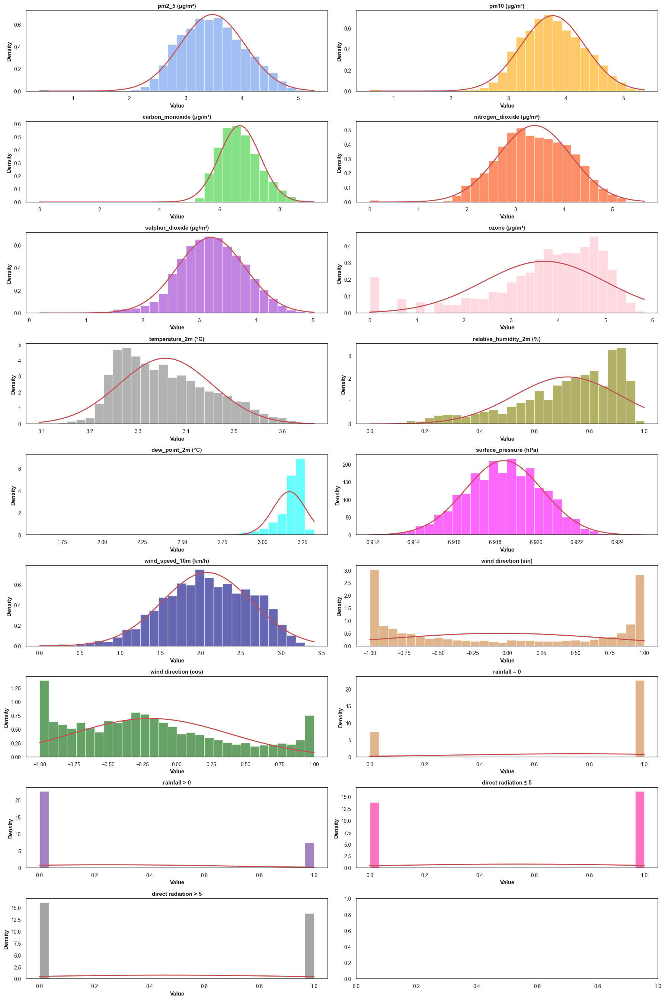

In [57]:
# Data distribution with histplot
univariate_analysis(
    df            = df_log, 
    plot_type     = 'histplot', 
    col_decode    = col_decode, 
    nrows         = int(18 / 2), 
    ncols         = 2, 
    figsize       = (18, int(18 * 1.5)),
    color_variant = color_variant,
    group         = 18,
    save_path     = '../reports/figures/univariate_analysis/log_histplot_all_columns.png'
)

## Past Covariates With Outliers

In [58]:
# Chek data
df_past_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
y2,25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
y3,25464.000,1010.616,870.051,0.000,481.000,738.000,1200.000,9391.000
y4,25464.000,38.159,30.539,0.000,16.700,28.300,51.100,284.800
y5,25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
y6,25464.000,68.489,57.695,0.000,23.000,53.000,105.000,337.000
x1,25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
x2,25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
x3,25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


In [59]:
# Save as CSV
df_past_encoded.to_csv('../data/processed/past_covariates.csv', index=True)

## Future Covariates

In [60]:
# Check statistics descriptive
df_future_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
x9,35707.000,2.208,0.815,1.000,1.000,2.000,3.000,3.000
x10,35707.000,4.002,2.001,1.000,2.000,4.000,6.000,7.000
x11,35707.000,0.045,0.207,0.000,0.000,0.000,0.000,1.000
x12,35707.000,1.571,0.495,1.000,1.000,2.000,2.000,2.000


In [61]:
# Save as CSV
df_future_encoded.to_csv('../data/processed/future_covariates.csv', index=True)

## Future Covariates with Optimized Method

In [62]:
# Change categorical to one hot encoding

# Initializee columns to transform first
cols_sincos_waktu = ['x9']
cols_sincos_hari = ['x10']
cols_onehot_future = ['x11', 'x12']

df_future_encoded_v2 = df_future_encoded.copy()

# Apply Sin-Cos Encoding transform
df_future_encoded_v2 = sincos_transform(
    df     = df_future_encoded_v2,
    cols   = cols_sincos_hari,
    period = 3
)

# Apply Sin-Cos Encoding transform
df_future_encoded_v2 = sincos_transform(
    df     = df_future_encoded_v2,
    cols   = cols_sincos_waktu,
    period = 7
)

# Apply One-Hot Encoding transform
df_future_encoded_v2 = pd.get_dummies(
    df_future_encoded_v2,
    columns=cols_onehot_future,
    prefix=cols_onehot_future
)

# Save as CSV
df_future_encoded_v2.to_csv('../data/processed/future_covariates_optimized.csv', index=True)
print(df_future_encoded_v2.head())
df_future_encoded_v2.describe().T

                       x9   x10  x10_sin  x10_cos  x9_sin  x9_cos  x11_0.0  \
t                                                                            
2022-08-05 00:00:00 3.000 5.000   -0.866   -0.500   0.434  -0.901     True   
2022-08-05 01:00:00 3.000 5.000   -0.866   -0.500   0.434  -0.901     True   
2022-08-05 02:00:00 3.000 5.000   -0.866   -0.500   0.434  -0.901     True   
2022-08-05 03:00:00 3.000 5.000   -0.866   -0.500   0.434  -0.901     True   
2022-08-05 04:00:00 3.000 5.000   -0.866   -0.500   0.434  -0.901     True   

                     x11_1.0  x12_1.0  x12_2.0  
t                                               
2022-08-05 00:00:00    False     True    False  
2022-08-05 01:00:00    False     True    False  
2022-08-05 02:00:00    False     True    False  
2022-08-05 03:00:00    False     True    False  
2022-08-05 04:00:00    False     True    False  


,count,mean,std,min,25%,50%,75%,max
x9,35707.000,2.208,0.815,1.000,1.000,2.000,3.000,3.000
x10,35707.000,4.002,2.001,1.000,2.000,4.000,6.000,7.000
x10_sin,35707.000,0.124,0.721,-0.866,-0.866,-0.000,0.866,0.866
x10_cos,35707.000,-0.072,0.678,-0.500,-0.500,-0.500,1.000,1.000
x9_sin,35707.000,0.679,0.236,0.434,0.434,0.782,0.975,0.975
x9_cos,35707.000,-0.322,0.616,-0.901,-0.901,-0.223,0.623,0.623


## Correlation Results

In [63]:
# Check correlation results
print('type:',type(results_r))
results_r

type: <class 'pandas.core.frame.DataFrame'>


,Feature,Correlation
0,relative_humidity_2m (%),0.399
1,temperature_2m (°C),0.356
2,direct_radiation (W/m²),0.339
3,wind_speed_10m (km/h),0.319
4,dew_point_2m (°C),0.296
5,wind_direction_10m (°),0.182
6,surface_pressure (hPa),0.093
7,rain (mm),0.039


In [64]:
# Save correlation results
results_r.to_csv('../data/processed/correlation_scores.csv', index=False, header=True)